# Income Transition Matrix

In this Jupyter Notebook, we use PSID data to calculate income transition matrices conditional on age and on the key variables from Chetty, et al (2014): high school dropout rate, crime rate (social capital), and inequality (gini coefficient).

The income transition matrix is:
$$\begin{bmatrix} p_{11} & p_{12} & p_{13} &p_{14} \\ p_{21} & p_{22} & p_{23} &p_{24} \\ p_{31} & p_{32} & p_{33} &p_{34} \\p_{41} & p_{42} & p_{43} &p_{44} \end{bmatrix}$$

$p_{11}$ refers to the probability of an individual whose income is below the lower quartile at period 1 will also have income below the lower quartile at period 2.

$p_{12}$ refers to the probability of an individual whose income is below the lower quartile at period 1 will have income above the lower quartile but below the median at period 2.

$p_{13}$ refers to the probability of an individual whose income is below the lower quartile at period 1 will have income above the median but below the upper quartile at period 2.

$p_{14}$ refers to the probability of an individual whose income is below the lower quartile at period 1 will have income above the upper quartile at period 2.

Other probabilities have similar interpretations.

# 1. No location variable

In [128]:
from bokeh.plotting import figure, output_file, show
import numpy as np
import pandas as pd
import xlrd
from bokeh.layouts import widgetbox
from bokeh.layouts import column
from bokeh.models import CustomJS, ColumnDataSource, MultiSelect
from bokeh.plotting import figure, output_file, show
import pandas as pd
from bokeh.io import output_file, show
from bokeh.models.widgets import CheckboxGroup
import numpy as np
from bokeh.layouts import row, column
from bokeh.models import CustomJS, Slider
from bokeh.plotting import figure, output_file, show, ColumnDataSource
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.widgets import Slider
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from ipywidgets import interact, interactive, fixed,interact_manual
import ipywidgets as wg
from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import random
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.tree import export_graphviz
import graphviz

In [2]:
data = xlrd.open_workbook('/Users/fulinguo/Desktop/IncomeTrans/Data/family/feature.xlsx')

In [3]:
table = data.sheets()[0]
nrows = table.nrows
columns=table.row_values(0)
income=[]
for i in range(1,nrows):
    income.append(table.row_values(i))
income=np.array(income)
income=pd.DataFrame(income,columns=columns)

In [4]:
income=income.replace('',0)
income=income.astype('float')
income.head()

,V1,V3,hi1,wi1,s1,ha1,wa1,g1,r1,d1,...,d40,dw40,spaw40,rw40,ew40,spa40,r40,e40,hi40,wi40
0,3.0,1.0,1711.0,3903.0,24.0,52.0,46.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,3.0,2.0,0.0,0.0,24.0,56.0,57.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
headage_ind=[i for i in columns if 'ha' in i]
wifeage_ind=[i for i in columns if 'wa' in i]
headinc_ind=[i for i in columns if 'hi' in i]
wifeinc_ind=[i for i in columns if 'wi' in i]
state_ind=[i for i in columns if ('s' in i) and ('spa' not in i)]
headsex_ind=[i for i in columns if ('g' in i) and ('burg' not in i)]
headrace_ind=[i for i in columns if ('r' in i) and ('rw' not in i) and ('c' not in i) and ('b' not in i) and ('o' not in i)]
wiferace_ind=[i for i in columns if 'rw' in i]
wifedis_ind=[i for i in columns if 'dw' in i]
headdis_ind=[i for i in columns if ('d' in i) and ('dw' not in i) and ('b' not in i) and ('c' not in i)]
headspa_ind=[i for i in columns if ('spa' in i) and ('spaw' not in i)]
headethnic_ind=[i for i in columns if ('e' in i) and ('ew' not in i) and ('n' not in i) and ('o' not in i)]
wifeethnic_ind=[i for i in columns if 'ew' in i]
wifespa_ind=[i for i in columns if 'spaw' in i]
headchi_ind=[i for i in columns if 'hc' in i]
headjob_ind=[i for i in columns if 'hj' in i]
hanum=[]
wanum=[]
hinum=[]
winum=[]
stanum=[]
hgnum=[]
hrnum=[]
wrnum=[]
hdnum=[]
wdnum=[]
hsnum=[]
wsnum=[]
henum=[]
wenum=[]
hcnum=[]
hjnum=[]

for i in headage_ind:
    hanum.append(columns.index(i))
for i in wifeage_ind:
    wanum.append(columns.index(i))
for i in headinc_ind:
    hinum.append(columns.index(i))
for i in wifeinc_ind:
    winum.append(columns.index(i))
for i in state_ind:
    stanum.append(columns.index(i))
for i in headsex_ind:
    hgnum.append(columns.index(i))
for i in headrace_ind:
    hrnum.append(columns.index(i))
for i in wiferace_ind:
    wrnum.append(columns.index(i))
for i in wifedis_ind:
    wdnum.append(columns.index(i))
for i in headdis_ind:
    hdnum.append(columns.index(i))
for i in headspa_ind:
    hsnum.append(columns.index(i))
for i in wifespa_ind:
    wsnum.append(columns.index(i))
for i in headethnic_ind:
    henum.append(columns.index(i))
for i in wifeethnic_ind:
    wenum.append(columns.index(i))
for i in headchi_ind:
    hcnum.append(columns.index(i))
for i in headjob_ind:
    hjnum.append(columns.index(i))

In [6]:
headinc_quan=[]
for ind in headinc_ind:
    upp=income[(income[ind]!=0)][ind].quantile(0.75)
    med=income[(income[ind]!=0)][ind].quantile(0.5)
    low=income[(income[ind]!=0)][ind].quantile(0.25)
    headinc_quan.append([upp,med,low])
headinc_quan=np.array(headinc_quan)
headinc_quan

array([[  7750.  ,   5000.  ,   2620.  ],
       [  8247.  ,   5250.  ,   2970.5 ],
       [  8900.  ,   5613.  ,   3033.  ],
       [  9300.  ,   6000.  ,   3079.5 ],
       [  9800.  ,   6322.  ,   3432.  ],
       [ 10500.  ,   7000.  ,   3800.  ],
       [ 11500.  ,   7500.  ,   4142.  ],
       [ 12100.  ,   8000.  ,   4500.  ],
       [ 13000.  ,   8500.  ,   4650.  ],
       [ 14573.75,   9257.5 ,   5000.  ],
       [ 16000.  ,  10000.  ,   5600.  ],
       [ 17500.  ,  11000.  ,   6050.  ],
       [ 19000.  ,  12000.  ,   6800.  ],
       [ 20246.75,  13000.  ,   7000.  ],
       [ 22759.  ,  14000.  ,   7583.  ],
       [ 23400.  ,  14161.  ,   7400.5 ],
       [ 25000.  ,  15000.  ,   8000.  ],
       [ 26906.5 ,  16076.5 ,   9000.  ],
       [ 27974.5 ,  17000.  ,   9256.  ],
       [ 29000.  ,  18000.  ,   9647.25],
       [ 30000.  ,  18775.  ,  10000.  ],
       [ 32000.  ,  20000.  ,  11000.  ],
       [ 31000.  ,  19200.  ,  10500.  ],
       [ 32000.  ,  20000.  ,  110

In [7]:
income.values

array([[3.000e+00, 1.000e+00, 1.711e+03, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       ...,
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00],
       [0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
        0.000e+00]])

In [7]:
tt=[]

In [8]:
headmed_mar1=[[0]*16]*60
headmed_mar1=np.array(headmed_mar1)
for i in range(len(income)):
    for j in range(len(headage_ind)-1):
        type=16
        age=income.values[i][hanum[j]]
        inc=income.values[i][hinum[j]]
        age2=income.values[i][hanum[j+1]] # set the period interval be 1 year
        inc2=income.values[i][hinum[j+1]]
        sex=income.values[i][hgnum[j]]
        if (age>=20) & (age2>=20) & (age<=79) &(age2<=80) & (inc!=0) & (inc2!=0) & (sex==1):
            if (inc<headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=0
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=1
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=2
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=3
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=4
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=5
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=6
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=7
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2<headinc_quan[j+1][2]):
                type=8
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=9
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=10
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][0]):
                type=11
            elif (inc>=headinc_quan[j][0]) & (inc2<headinc_quan[j+1][2]):
                type=12
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=13
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=14
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][0]):
                type=15
            headmed_mar1[int(age)-20][type]+=1
            tt.append(type)

In [9]:
headmed_mar1=headmed_mar1.reshape(60,4,4)
print('Number matrices:\n',headmed_mar1)
headmarkov1=[]
for i in range(len(headmed_mar1)):
    for j in range(4):
        sum_quan=sum(headmed_mar1[i][j])
        headmed_mar1[i][j]/max(sum_quan,0.1)
        headmarkov1.append(headmed_mar1[i][j]/max(sum_quan,0.1))
headmarkov1=np.array(headmarkov1)
headmarkov1=headmarkov1.reshape(60,4,4)

Number matrices:
 [[[ 386  210   48    7]
  [  99  254  133   16]
  [  18   56  110   17]
  [   0    4   11   21]]

 [[ 462  272   63   11]
  [ 128  457  186   26]
  [  27   99  241   48]
  [   7    8   14   43]]

 [[ 504  294  103   15]
  [ 187  564  266   48]
  [  37  111  385   78]
  [   5    8   47   83]]

 [[ 564  348  116   28]
  [ 224  669  338   75]
  [  47  184  525  175]
  [  10   18   76  160]]

 [[ 544  336  116   35]
  [ 232  784  397   67]
  [  65  225  723  215]
  [   5   24  105  299]]

 [[ 489  320  115   28]
  [ 240  817  457   61]
  [  59  216  890  305]
  [  11   20  130  477]]

 [[ 449  291   87   28]
  [ 214  785  417   71]
  [  77  266  970  307]
  [  15   28  153  611]]

 [[ 419  258   77   31]
  [ 227  802  395   76]
  [  78  272  967  351]
  [  16   34  174  784]]

 [[ 427  257   94   26]
  [ 193  712  365   87]
  [  82  256  988  332]
  [  15   35  203  937]]

 [[ 391  226   73   24]
  [ 193  702  365   71]
  [  69  268 1073  352]
  [  18   33  225 1041]]

 [

In [10]:
print(headmarkov1)

[[[0.59293395 0.32258065 0.07373272 0.01075269]
  [0.19721116 0.5059761  0.26494024 0.03187251]
  [0.08955224 0.27860697 0.54726368 0.08457711]
  [0.         0.11111111 0.30555556 0.58333333]]

 [[0.57178218 0.33663366 0.0779703  0.01361386]
  [0.16060226 0.57340025 0.23337516 0.03262233]
  [0.06506024 0.23855422 0.58072289 0.11566265]
  [0.09722222 0.11111111 0.19444444 0.59722222]]

 [[0.55021834 0.3209607  0.11244541 0.01637555]
  [0.17558685 0.52957746 0.24976526 0.04507042]
  [0.06055646 0.18166939 0.63011457 0.12765957]
  [0.03496503 0.05594406 0.32867133 0.58041958]]

 [[0.53409091 0.32954545 0.10984848 0.02651515]
  [0.17151608 0.51225115 0.25880551 0.05742726]
  [0.05048335 0.19763695 0.56390977 0.18796992]
  [0.03787879 0.06818182 0.28787879 0.60606061]]

 [[0.52764306 0.32589719 0.11251212 0.03394762]
  [0.15675676 0.52972973 0.26824324 0.04527027]
  [0.0529316  0.18322476 0.58876221 0.17508143]
  [0.01154734 0.05542725 0.24249423 0.69053118]]

 [[0.51365546 0.33613445 0.120

<IPython.core.display.Javascript object>


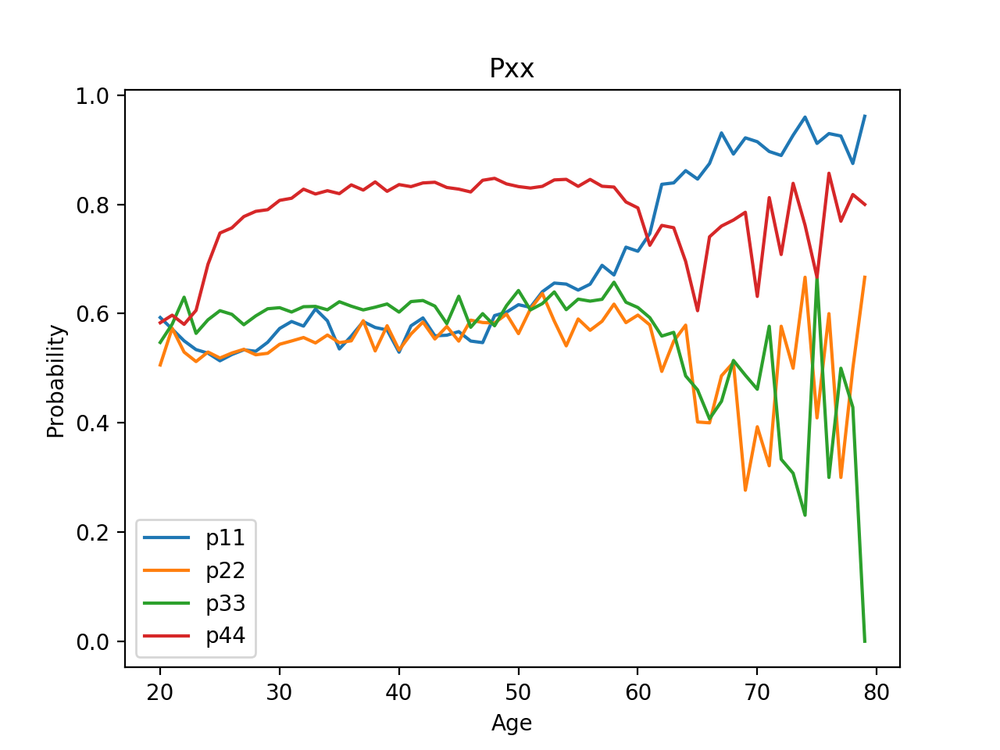

In [11]:
import matplotlib.pyplot as plt
q11=[]
q22=[]
q33=[]
q44=[]
for i in headmarkov1:
    q11.append(i[0][0])
    q22.append(i[1][1])
    q33.append(i[2][2])
    q44.append(i[3][3])
age=np.arange(20,20+len(q11))
%matplotlib notebook
plt.plot(age,q11,label='p11')
plt.plot(age,q22,label='p22')
plt.plot(age,q33,label='p33')
plt.plot(age,q44,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Pxx')
plt.legend()

Before 60 years old, p44 is highest than p11, p22, p33 for men.

<IPython.core.display.Javascript object>


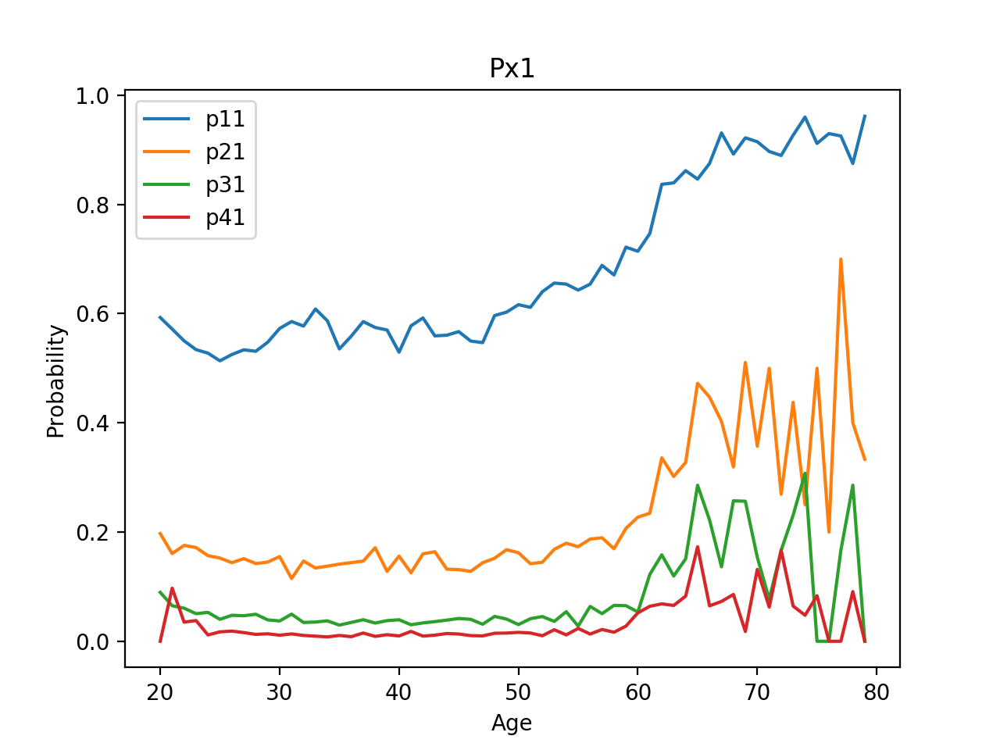

In [12]:
import matplotlib.pyplot as plt
q11=[]
q21=[]
q31=[]
q41=[]
for i in headmarkov1:
    q11.append(i[0][0])
    q21.append(i[1][0])
    q31.append(i[2][0])
    q41.append(i[3][0])
age=np.arange(20,20+len(q11))
%matplotlib notebook
plt.plot(age,q11,label='p11')
plt.plot(age,q21,label='p21')
plt.plot(age,q31,label='p31')
plt.plot(age,q41,label='p41')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px1')
plt.legend()

<IPython.core.display.Javascript object>


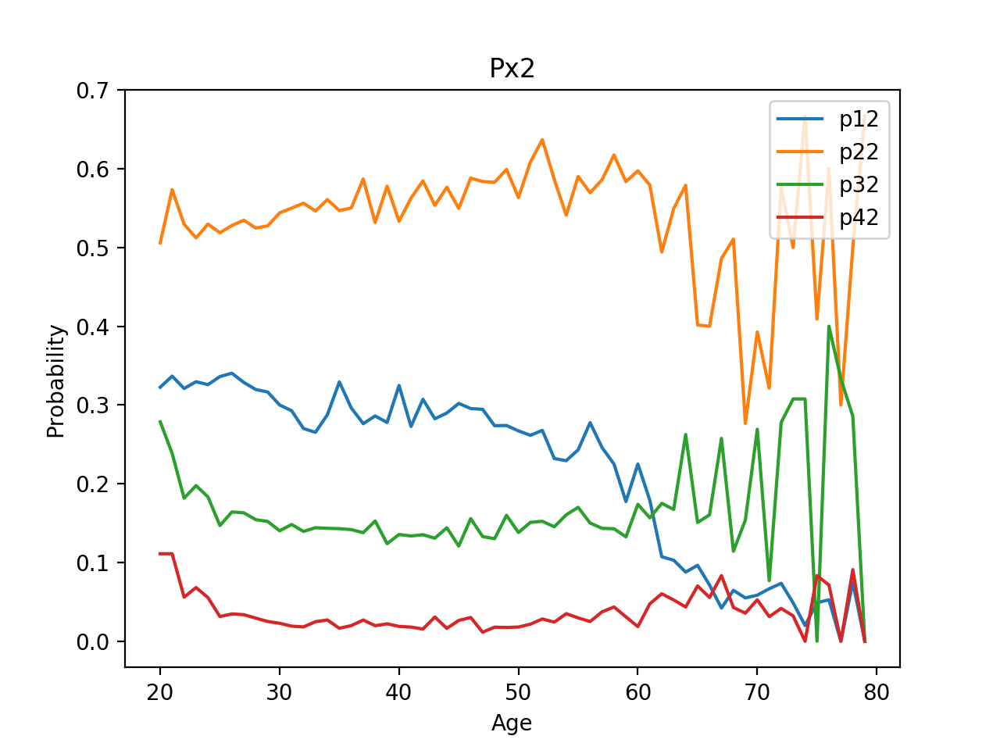

In [13]:
import matplotlib.pyplot as plt
q12=[]
q22=[]
q32=[]
q42=[]
for i in headmarkov1:
    q12.append(i[0][1])
    q22.append(i[1][1])
    q32.append(i[2][1])
    q42.append(i[3][1])
age=np.arange(20,20+len(q11))
%matplotlib notebook
plt.plot(age,q12,label='p12')
plt.plot(age,q22,label='p22')
plt.plot(age,q32,label='p32')
plt.plot(age,q42,label='p42')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px2')
plt.legend()

<IPython.core.display.Javascript object>


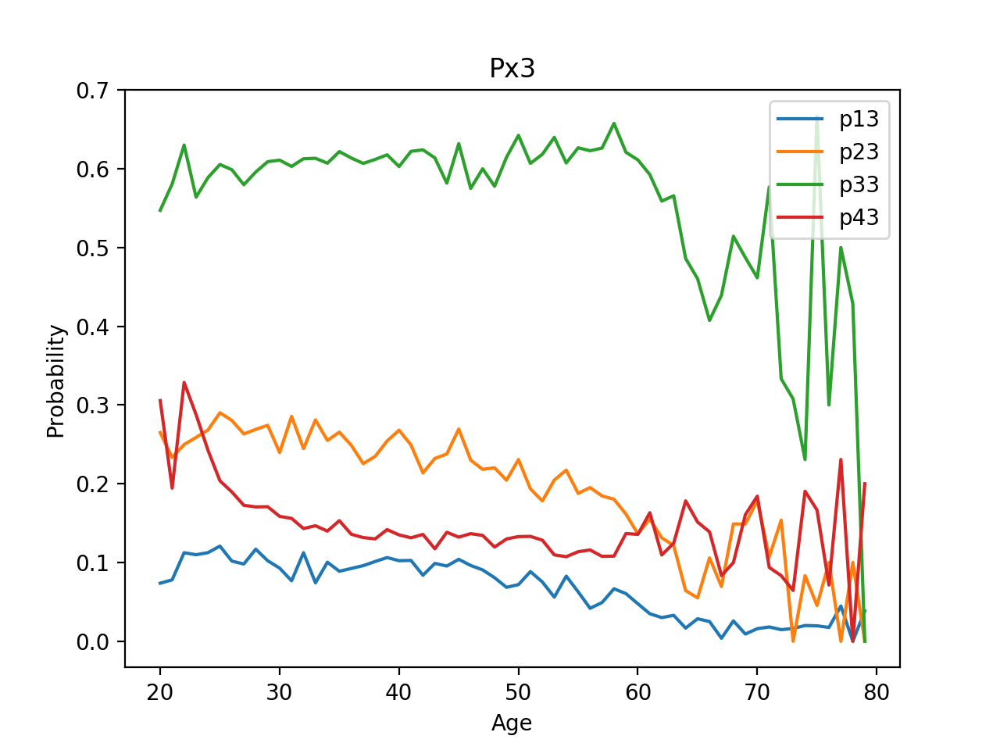

In [14]:
import matplotlib.pyplot as plt
q13=[]
q23=[]
q33=[]
q43=[]
for i in headmarkov1:
    q13.append(i[0][2])
    q23.append(i[1][2])
    q33.append(i[2][2])
    q43.append(i[3][2])
age=np.arange(20,20+len(q11))
%matplotlib notebook
plt.plot(age,q13,label='p13')
plt.plot(age,q23,label='p23')
plt.plot(age,q33,label='p33')
plt.plot(age,q43,label='p43')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px3')
plt.legend()

<IPython.core.display.Javascript object>


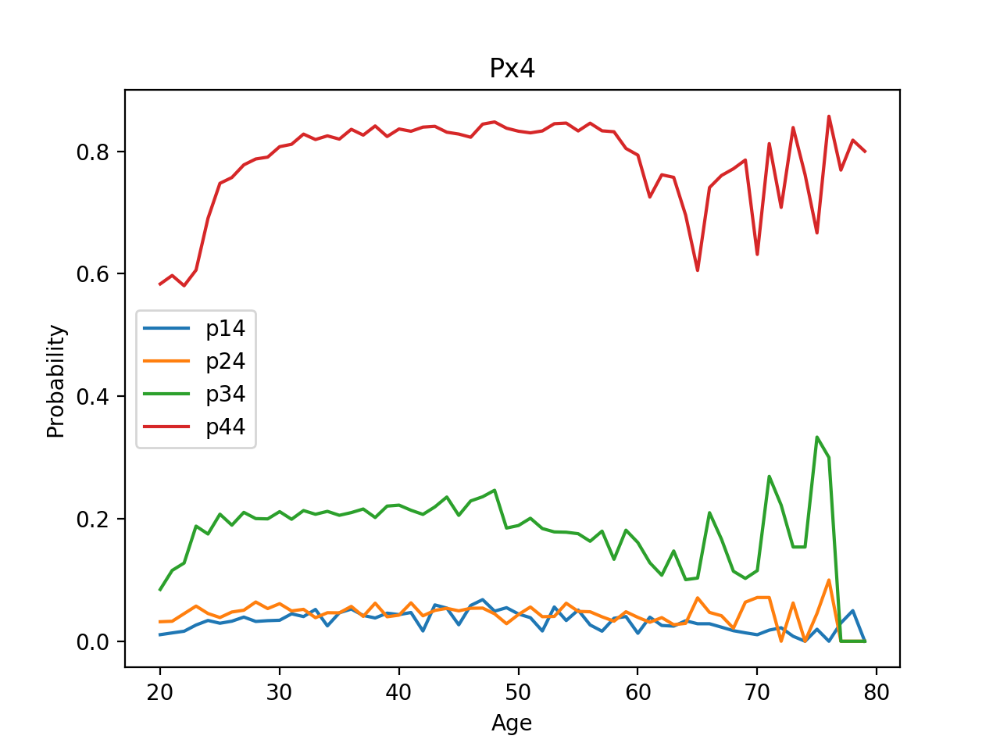

In [15]:
import matplotlib.pyplot as plt
q14=[]
q24=[]
q34=[]
q44=[]
for i in headmarkov1:
    q14.append(i[0][3])
    q24.append(i[1][3])
    q34.append(i[2][3])
    q44.append(i[3][3])
age=np.arange(20,20+len(q11))
%matplotlib notebook
plt.plot(age,q14,label='p14')
plt.plot(age,q24,label='p24')
plt.plot(age,q34,label='p34')
plt.plot(age,q44,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px4')
plt.legend()

In [16]:
from bokeh.layouts import widgetbox
from bokeh.layouts import column
from bokeh.models import CustomJS, ColumnDataSource, MultiSelect
from bokeh.plotting import figure, output_file, show
import pandas as pd
from bokeh.io import output_file, show
from bokeh.models.widgets import CheckboxGroup
import numpy as np
from bokeh.layouts import row, column
from bokeh.models import CustomJS, Slider
from bokeh.plotting import figure, output_file, show, ColumnDataSource

output_file("headmatrix.html")
p = figure(width=1000, height=700, x_axis_type="datetime")
p11=q11
p12=q12
p13=q13
p14=q14
p21=q21
p22=q22
p23=q23
p24=q24
p31=q31
p32=q32
p33=q33
p34=q34
p41=q41
p42=q42
p43=q43
p44=q44
plots=[]
x=age
color=['green', 'orange', 'yellow', 'blue',\
       'purple', 'cyan', 'pink', 'black', 'chocolate', \
       'red', 'gray', 'brown', 'burlywood', 'cadetblue', 'chartreuse','navy']
allp=[p11,p12,p13,p14,p21,p22,p23,p24,p31,p32,p33,p34,p41,p42,p43,p44]
strp=["p11", "p12", "p13",'p14',"p21", "p22", \
                                       "p23",'p24',"p31", "p32", "p33",'p34',\
                                       "p41", "p42", "p43",'p44']
for i in range(0,16):
    source = ColumnDataSource(data=dict(x=x, y=allp[i]))
    plt = p.line('x', 'y', line_width=2,  alpha=0.8, color=color[i],source=source,legend=strp[i])
    plots.append(plt)
checkbox_group = CheckboxGroup(labels=["p11", "p12", "p13",'p14',"p21", "p22", \
                                       "p23",'p24',"p31", "p32", "p33",'p34',\
                                       "p41", "p42", "p43",'p44'], active=list(range(0,16)))
args=dict(line0=plots[0],line1=plots[1], line2=plots[2], line3=plots[3],line4=plots[4], line5=plots[5], line6=plots[6],\
         line7=plots[7], line8=plots[8], line9=plots[9],line10=plots[10], line11=plots[11], line12=plots[12],\
         line13=plots[13], line14=plots[14], line15=plots[15])
checkbox_group.callback = CustomJS(args = args,  code=""" 
        //console.log(cb_obj.active);
        line0.visible = false;
        line1.visible = false;
        line2.visible = false;
        line3.visible = false;
        line4.visible = false;
        line5.visible = false;
        line6.visible = false;
        line7.visible = false;
        line8.visible = false;
        line9.visible = false;
        line10.visible = false;
        line11.visible = false;
        line12.visible = false;
        line13.visible = false;
        line14.visible = false;
        line15.visible = false;

        for (i in cb_obj.active) {
            //console.log(cb_obj.active[i]);
            if (cb_obj.active[i] == 0) {
                line0.visible = true;
            } else if (cb_obj.active[i] == 1) {
                line1.visible = true;
            } else if (cb_obj.active[i] == 2) {
                line2.visible = true;
            } else if (cb_obj.active[i] == 3) {
                line3.visible = true;
            } else if (cb_obj.active[i] == 4) {
                line4.visible = true;
            } else if (cb_obj.active[i] == 5) {
                line5.visible = true;
            } else if (cb_obj.active[i] == 6) {
                line6.visible = true;
            } else if (cb_obj.active[i] == 7) {
                line7.visible = true;
            } else if (cb_obj.active[i] == 8) {
                line8.visible = true;
            } else if (cb_obj.active[i] == 9) {
                line9.visible = true;
            } else if (cb_obj.active[i] == 10) {
                line10.visible = true;
            } else if (cb_obj.active[i] == 11) {
                line11.visible = true;
            } else if (cb_obj.active[i] == 12) {
                line12.visible = true;
            } else if (cb_obj.active[i] == 13) {
                line13.visible = true;
            } else if (cb_obj.active[i] == 14) {
                line14.visible = true;
            } else if (cb_obj.active[i] == 15) {
                line15.visible = true;
            }
        }
    """)

layout = row(p, widgetbox(checkbox_group), sizing_mode='fixed')

show(layout)

## Findings:
1. The fluctuation of the probability of men's income movement is larger when they are after 60 years old than before 60 years old (One reason is lack of data).
2. The probability of downward movement decreases slightly when men are between 20 and 30, and remain roughly constant between 30 and 60.
3. The probability of downward movement might increase after 60 years old.
4. The probability of upward movement remain roughly constant between 20 and 50 years old, but shows a decreasing trend after 50 years old.
5. Usually, upward probabilities (especially p12, p23) are higher than the corresponding downward probabilities (p21, p32) before 60 years old.
6. Before 60 years old, p44 is highest than p11, p22, p33 for men.
7. p11 increases in age.

In [17]:
wifemed_mar1=[[0]*16]*60
wifemed_mar1=np.array(wifemed_mar1)
for i in range(len(income)):
    for j in range(len(headage_ind)-1):
        type=16
        age=income.values[i][hanum[j]]
        inc=income.values[i][hinum[j]]
        age2=income.values[i][hanum[j+1]] # set the period interval be 1 year
        inc2=income.values[i][hinum[j+1]]
        sex=income.values[i][hgnum[j]]
        if (age>=20) & (age2>=20) & (age<=79) &(age2<=80) & (inc!=0) & (inc2!=0) & (sex==2):
            if (inc<headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=0
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=1
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=2
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=3
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=4
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=5
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=6
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=7
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2<headinc_quan[j+1][2]):
                type=8
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=9
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=10
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][0]):
                type=11
            elif (inc>=headinc_quan[j][0]) & (inc2<headinc_quan[j+1][2]):
                type=12
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=13
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=14
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][0]):
                type=15
            wifemed_mar1[int(age)-20][type]+=1

In [18]:
wifemed_mar1=wifemed_mar1.reshape(60,4,4)
print('Number matrices:\n',wifemed_mar1)
wifemarkov1=[]
for i in range(len(wifemed_mar1)):
    for j in range(4):
        sum_quan=sum(wifemed_mar1[i][j])
        wifemed_mar1[i][j]/max(sum_quan,0.1)
        wifemarkov1.append(wifemed_mar1[i][j]/max(sum_quan,0.1))
wifemarkov1=np.array(wifemarkov1)
wifemarkov1=wifemarkov1.reshape(60,4,4)

Number matrices:
 [[[351  88  17   4]
  [ 30  74  14   2]
  [  8   5  13   1]
  [  0   0   0   3]]

 [[413 114  24   1]
  [ 45 117  24   3]
  [ 16  11  23   3]
  [  0   0   1   9]]

 [[455 122  43   7]
  [ 60 191  38   5]
  [ 11  21  43  10]
  [  2   1   5  10]]

 [[405 204  41   9]
  [ 86 217  77   6]
  [  7  31  74  15]
  [  0   1   6  17]]

 [[416 147  34  13]
  [ 91 265  75  11]
  [ 16  37 126  27]
  [  1   2   6  38]]

 [[371 149  20  10]
  [ 69 279  83   8]
  [ 14  41 148  20]
  [  4   3  11  41]]

 [[384 120  23   5]
  [100 281  89   5]
  [ 12  45 144  40]
  [  1   7  19  40]]

 [[336 114  34   3]
  [ 96 238  88   7]
  [ 17  29 159  28]
  [  1   3  11  59]]

 [[353 105  20   2]
  [ 67 254  61  11]
  [ 20  42 162  26]
  [  3   2  14  55]]

 [[351 112  20   4]
  [ 70 269  75   6]
  [ 10  46 159  36]
  [  3   2  17  43]]

 [[314  92  21   5]
  [ 74 246  67   7]
  [ 12  30 166  36]
  [  0   0  16  61]]

 [[300  87  17   4]
  [ 62 220  75   5]
  [ 11  35 168  30]
  [  2   3  18  62]]

In [19]:
print(wifemarkov1)

[[[0.76304348 0.19130435 0.03695652 0.00869565]
  [0.25       0.61666667 0.11666667 0.01666667]
  [0.2962963  0.18518519 0.48148148 0.03703704]
  [0.         0.         0.         1.        ]]

 [[0.74818841 0.20652174 0.04347826 0.00181159]
  [0.23809524 0.61904762 0.12698413 0.01587302]
  [0.30188679 0.20754717 0.43396226 0.05660377]
  [0.         0.         0.1        0.9       ]]

 [[0.72567783 0.19457735 0.06858054 0.01116427]
  [0.20408163 0.64965986 0.1292517  0.0170068 ]
  [0.12941176 0.24705882 0.50588235 0.11764706]
  [0.11111111 0.05555556 0.27777778 0.55555556]]

 [[0.61456753 0.30955994 0.06221548 0.01365706]
  [0.22279793 0.56217617 0.19948187 0.01554404]
  [0.05511811 0.24409449 0.58267717 0.11811024]
  [0.         0.04166667 0.25       0.70833333]]

 [[0.68196721 0.24098361 0.0557377  0.02131148]
  [0.20588235 0.59954751 0.16968326 0.02488688]
  [0.0776699  0.17961165 0.61165049 0.13106796]
  [0.0212766  0.04255319 0.12765957 0.80851064]]

 [[0.67454545 0.27090909 0.036

<IPython.core.display.Javascript object>


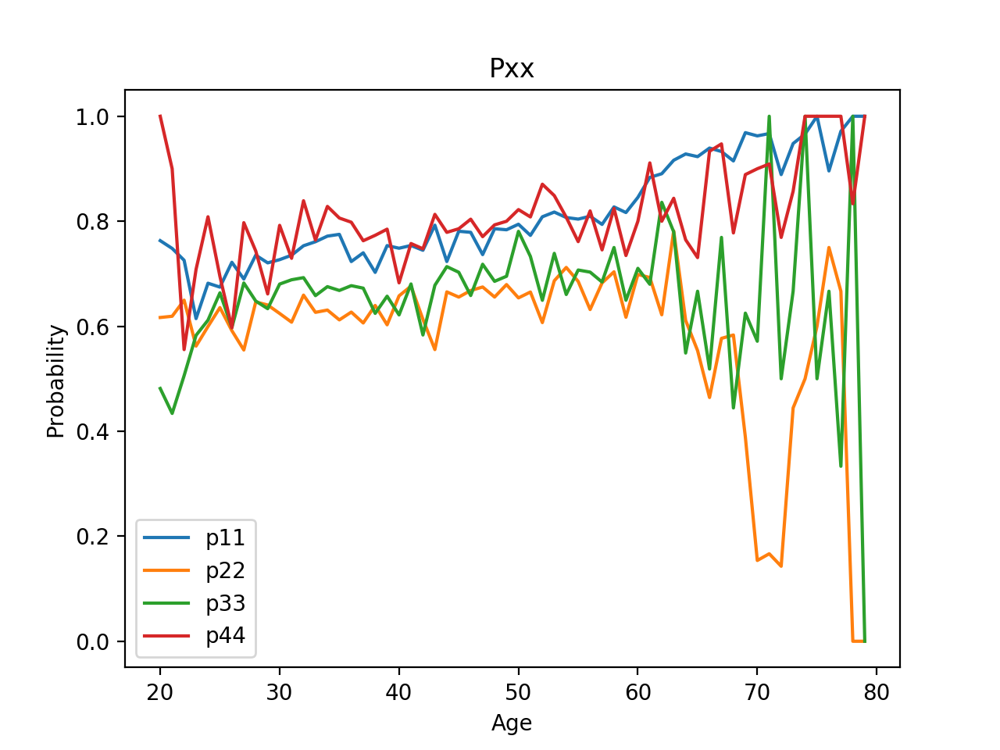

In [20]:
import matplotlib.pyplot as plt
wq11=[]
wq22=[]
wq33=[]
wq44=[]
for i in wifemarkov1:
    wq11.append(i[0][0])
    wq22.append(i[1][1])
    wq33.append(i[2][2])
    wq44.append(i[3][3])
age=np.arange(20,20+len(wq11))
%matplotlib notebook
plt.plot(age,wq11,label='p11')
plt.plot(age,wq22,label='p22')
plt.plot(age,wq33,label='p33')
plt.plot(age,wq44,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Pxx')
plt.legend()

For women, $p_{11}$ also increases in age, which is the same as men, but $p_{44}$ is not significantly higher than other $p_{ii}$.

<IPython.core.display.Javascript object>


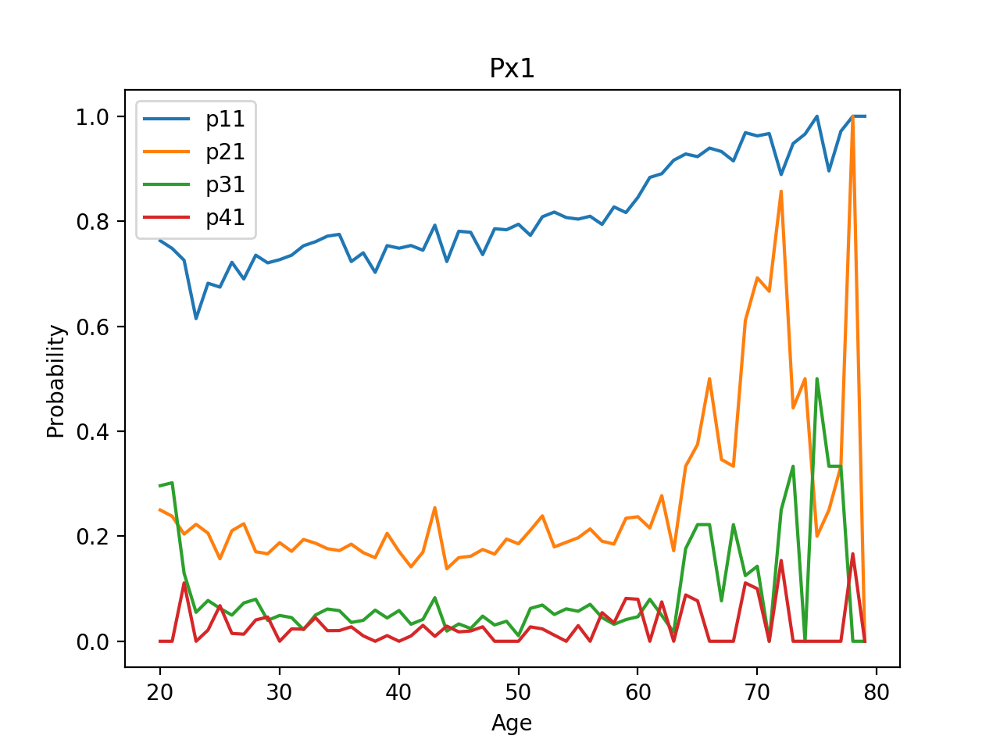

In [21]:
import matplotlib.pyplot as plt
wq11=[]
wq21=[]
wq31=[]
wq41=[]
for i in wifemarkov1:
    wq11.append(i[0][0])
    wq21.append(i[1][0])
    wq31.append(i[2][0])
    wq41.append(i[3][0])
age=np.arange(20,20+len(wq11))
%matplotlib notebook
plt.plot(age,wq11,label='p11')
plt.plot(age,wq21,label='p21')
plt.plot(age,wq31,label='p31')
plt.plot(age,wq41,label='p41')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px1')
plt.legend()

<IPython.core.display.Javascript object>


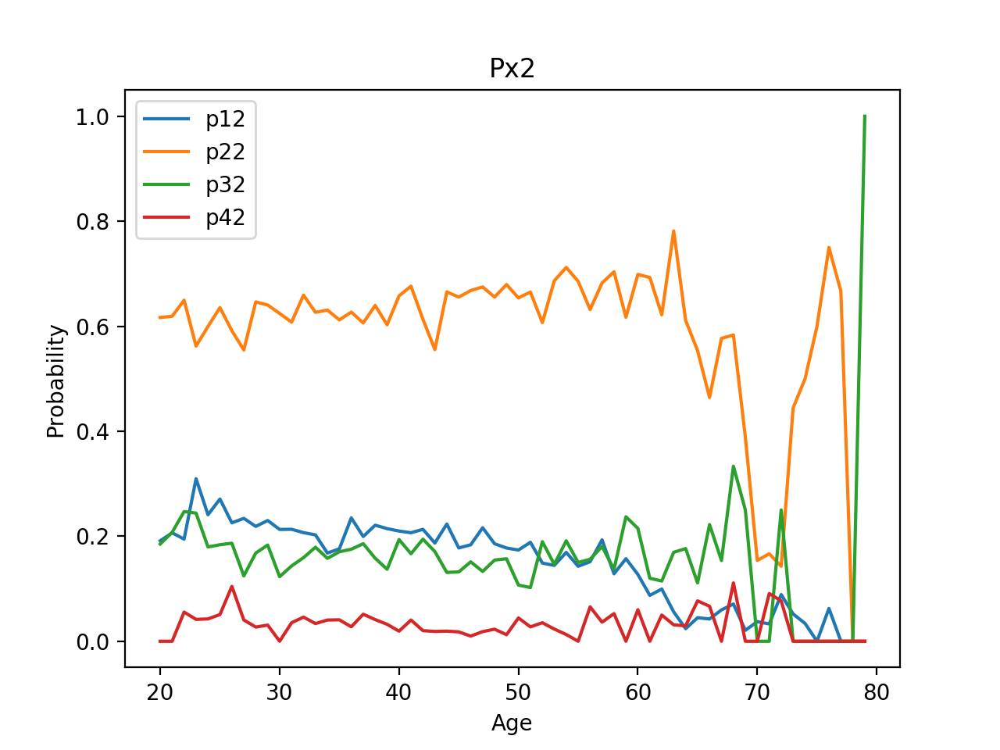

In [22]:
import matplotlib.pyplot as plt
wq12=[]
wq22=[]
wq32=[]
wq42=[]
for i in wifemarkov1:
    wq12.append(i[0][1])
    wq22.append(i[1][1])
    wq32.append(i[2][1])
    wq42.append(i[3][1])
age=np.arange(20,20+len(wq11))
%matplotlib notebook
plt.plot(age,wq12,label='p12')
plt.plot(age,wq22,label='p22')
plt.plot(age,wq32,label='p32')
plt.plot(age,wq42,label='p42')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px2')
plt.legend()

<IPython.core.display.Javascript object>


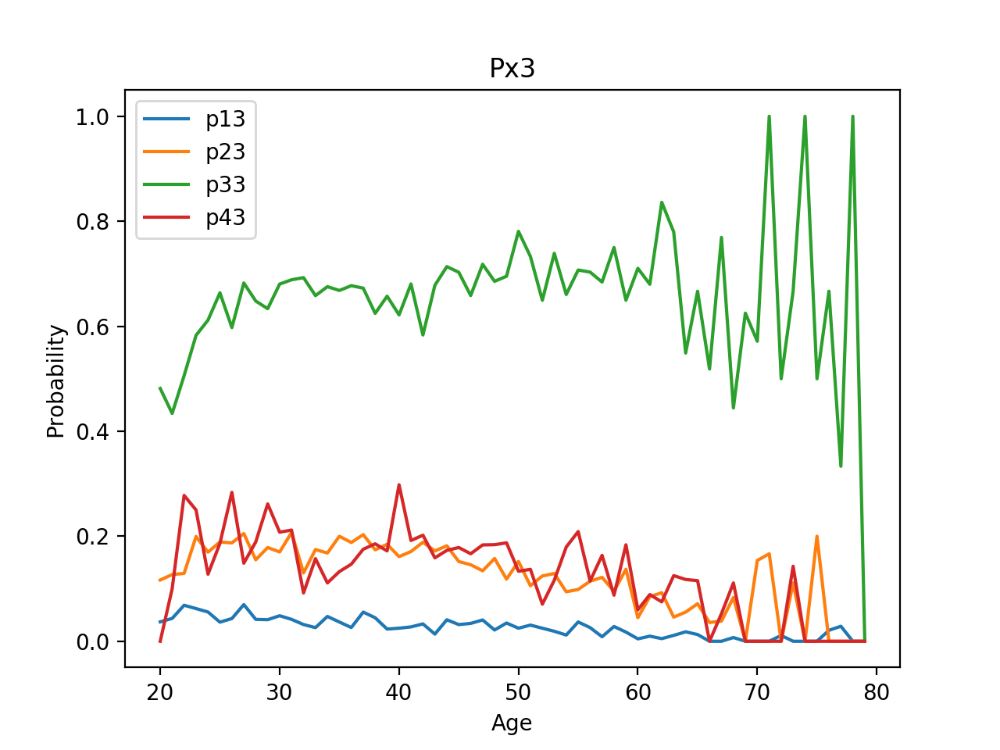

In [23]:
import matplotlib.pyplot as plt
wq13=[]
wq23=[]
wq33=[]
wq43=[]
for i in wifemarkov1:
    wq13.append(i[0][2])
    wq23.append(i[1][2])
    wq33.append(i[2][2])
    wq43.append(i[3][2])
age=np.arange(20,20+len(wq11))
%matplotlib notebook
plt.plot(age,wq13,label='p13')
plt.plot(age,wq23,label='p23')
plt.plot(age,wq33,label='p33')
plt.plot(age,wq43,label='p43')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px3')
plt.legend()

<IPython.core.display.Javascript object>


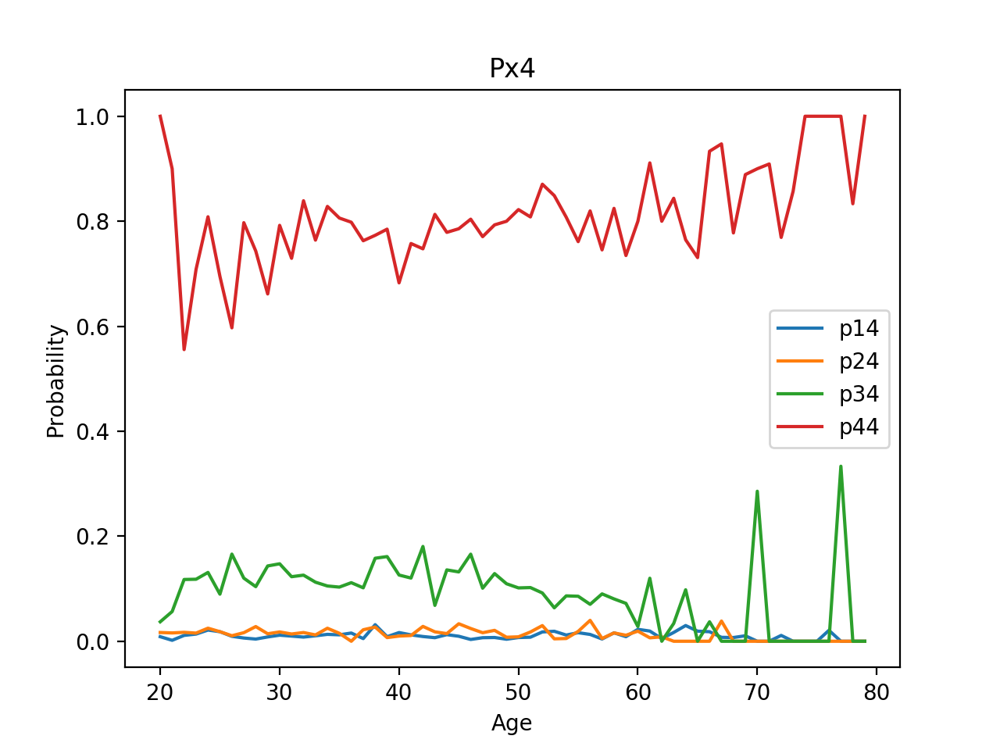

In [24]:
import matplotlib.pyplot as plt
wq14=[]
wq24=[]
wq34=[]
wq44=[]
for i in wifemarkov1:
    wq14.append(i[0][3])
    wq24.append(i[1][3])
    wq34.append(i[2][3])
    wq44.append(i[3][3])
age=np.arange(20,20+len(wq11))
%matplotlib notebook
plt.plot(age,wq14,label='p14')
plt.plot(age,wq24,label='p24')
plt.plot(age,wq34,label='p34')
plt.plot(age,wq44,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px4')
plt.legend()

<IPython.core.display.Javascript object>


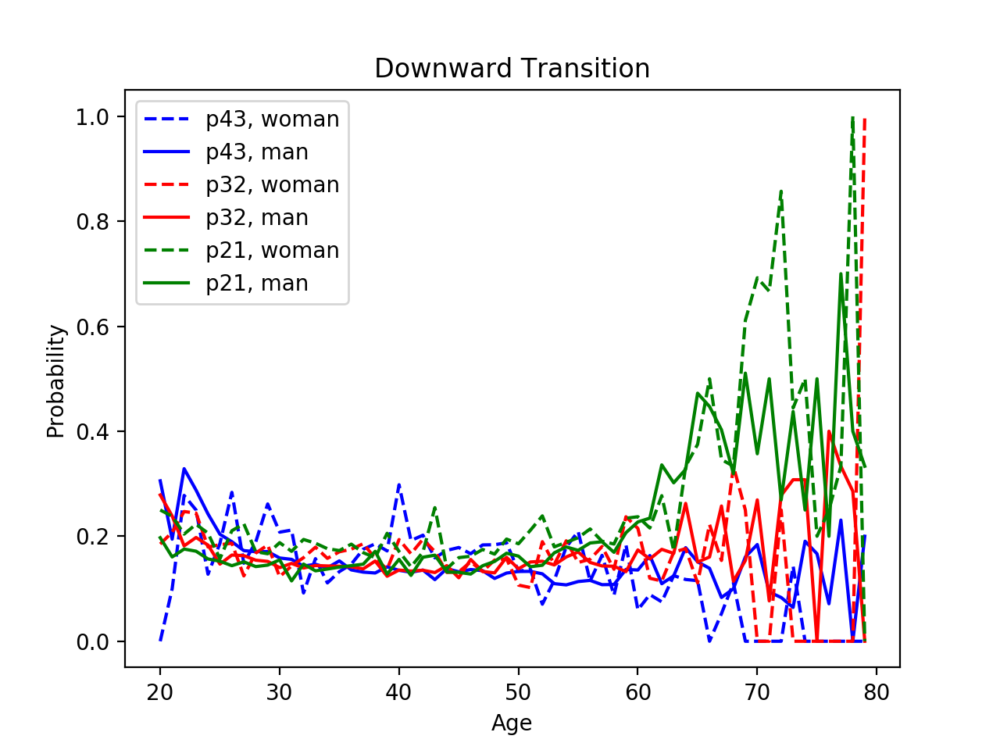

In [25]:
%matplotlib notebook
plt.plot(age,wq43,color='blue', linestyle='dashed', label='p43, woman')
plt.plot(age,q43, color='blue', label='p43, man')
plt.plot(age,wq32,color='red', linestyle='dashed',label='p32, woman')
plt.plot(age,q32,color='red', label='p32, man')
plt.plot(age,wq21,color='green', linestyle='dashed',label='p21, woman')
plt.plot(age,q21,color='green', label='p21, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Downward Transition')
plt.legend()

<IPython.core.display.Javascript object>


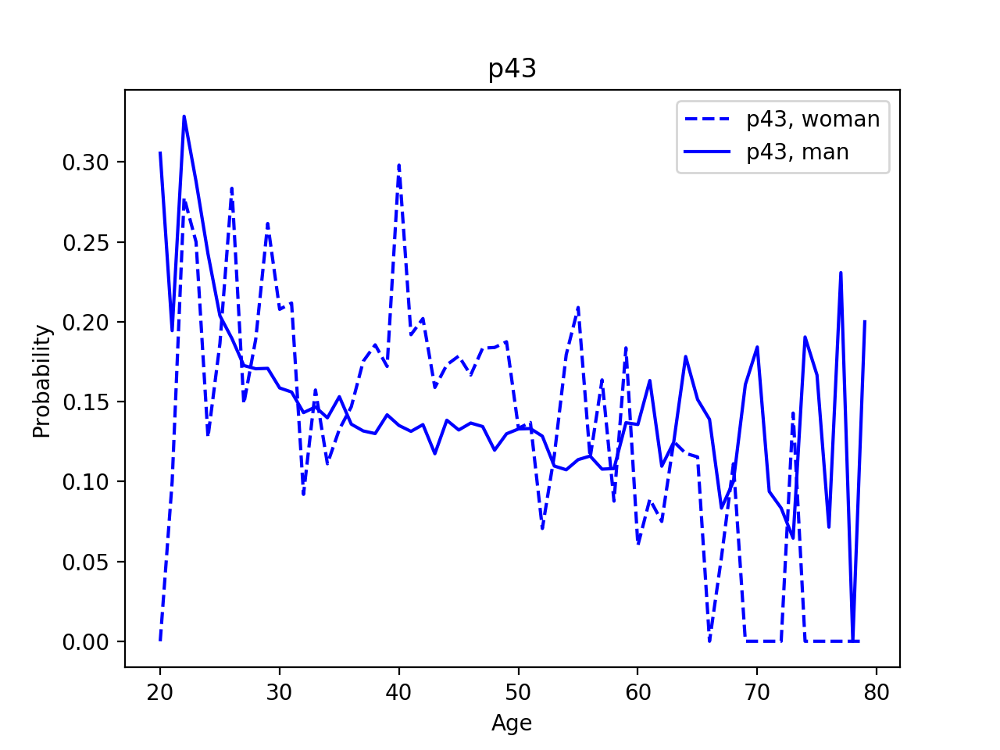

In [26]:
%matplotlib notebook
plt.plot(age,wq43,color='blue', linestyle='dashed', label='p43, woman')
plt.plot(age,q43, color='blue', label='p43, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p43')
plt.legend()

<IPython.core.display.Javascript object>


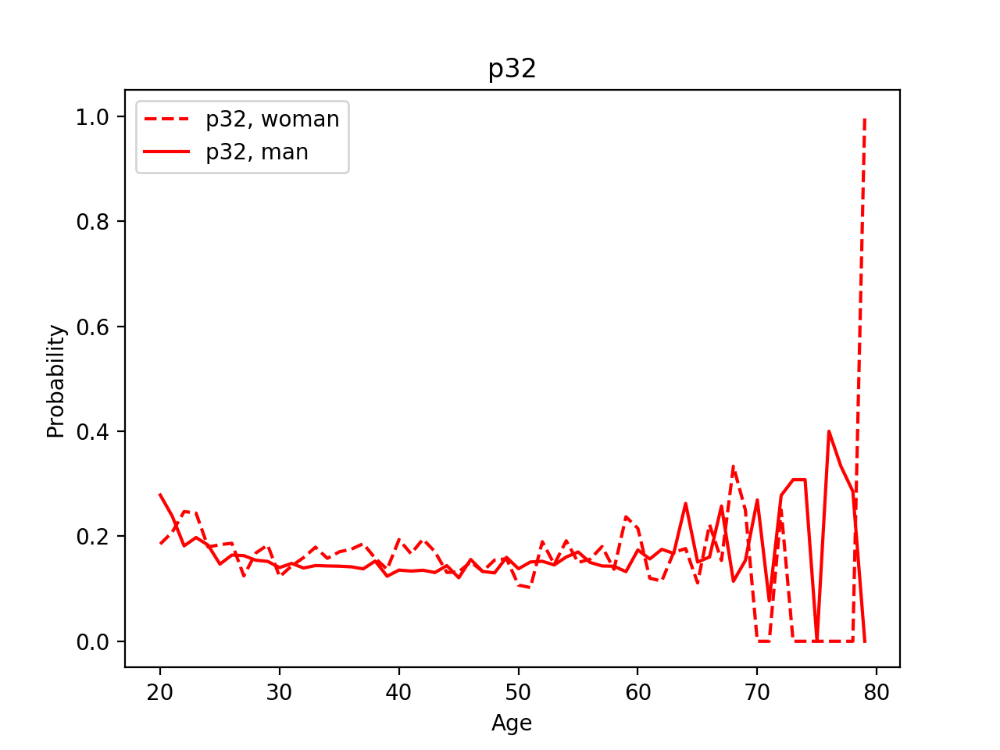

In [27]:
%matplotlib notebook
plt.plot(age,wq32,color='red', linestyle='dashed',label='p32, woman')
plt.plot(age,q32,color='red', label='p32, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p32')
plt.legend()

<IPython.core.display.Javascript object>


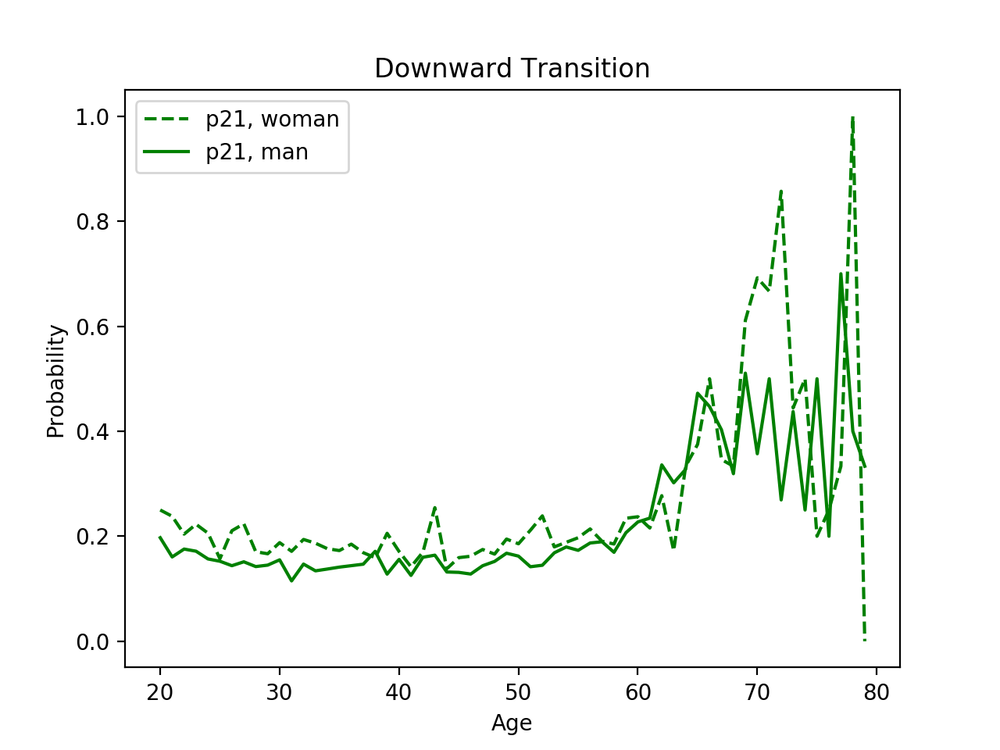

In [28]:
%matplotlib notebook
plt.plot(age,wq21,color='green', linestyle='dashed',label='p21, woman')
plt.plot(age,q21,color='green', label='p21, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Downward Transition')
plt.legend()

<IPython.core.display.Javascript object>


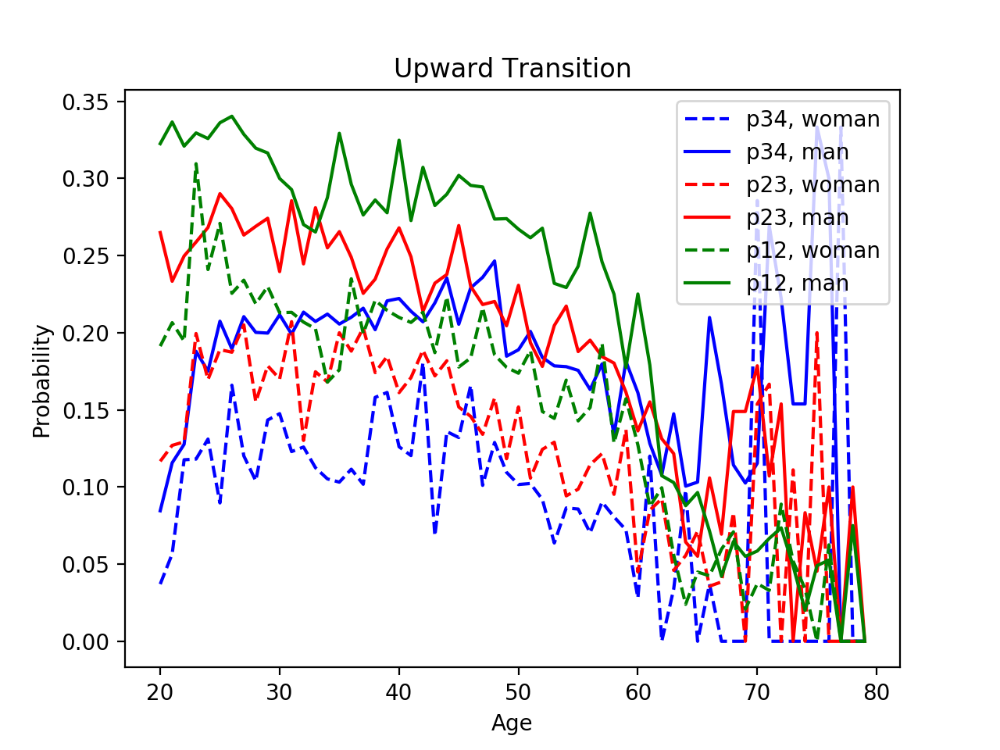

In [29]:
%matplotlib notebook
plt.plot(age,wq34,color='blue', linestyle='dashed', label='p34, woman')
plt.plot(age,q34, color='blue', label='p34, man')
plt.plot(age,wq23,color='red', linestyle='dashed',label='p23, woman')
plt.plot(age,q23,color='red', label='p23, man')
plt.plot(age,wq12,color='green', linestyle='dashed',label='p12, woman')
plt.plot(age,q12,color='green', label='p12, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Upward Transition')
plt.legend()

<IPython.core.display.Javascript object>


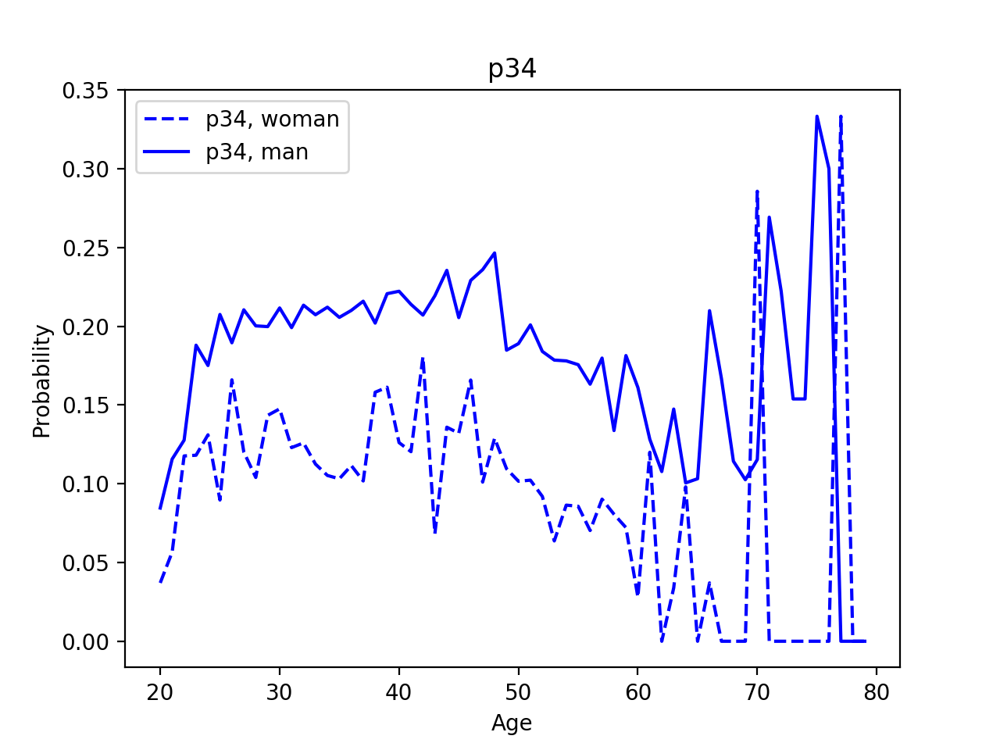

In [30]:
%matplotlib notebook
plt.plot(age,wq34,color='blue', linestyle='dashed', label='p34, woman')
plt.plot(age,q34, color='blue', label='p34, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p34')
plt.legend()

<IPython.core.display.Javascript object>


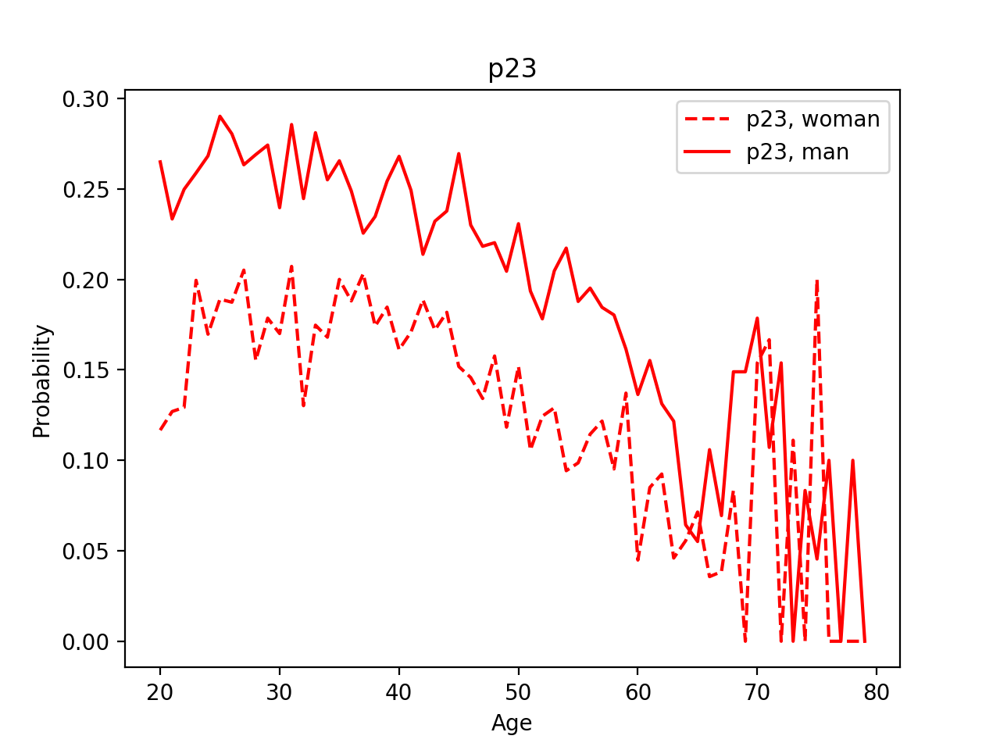

In [31]:
%matplotlib notebook
plt.plot(age,wq23,color='red', linestyle='dashed',label='p23, woman')
plt.plot(age,q23,color='red', label='p23, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p23')
plt.legend()

<IPython.core.display.Javascript object>


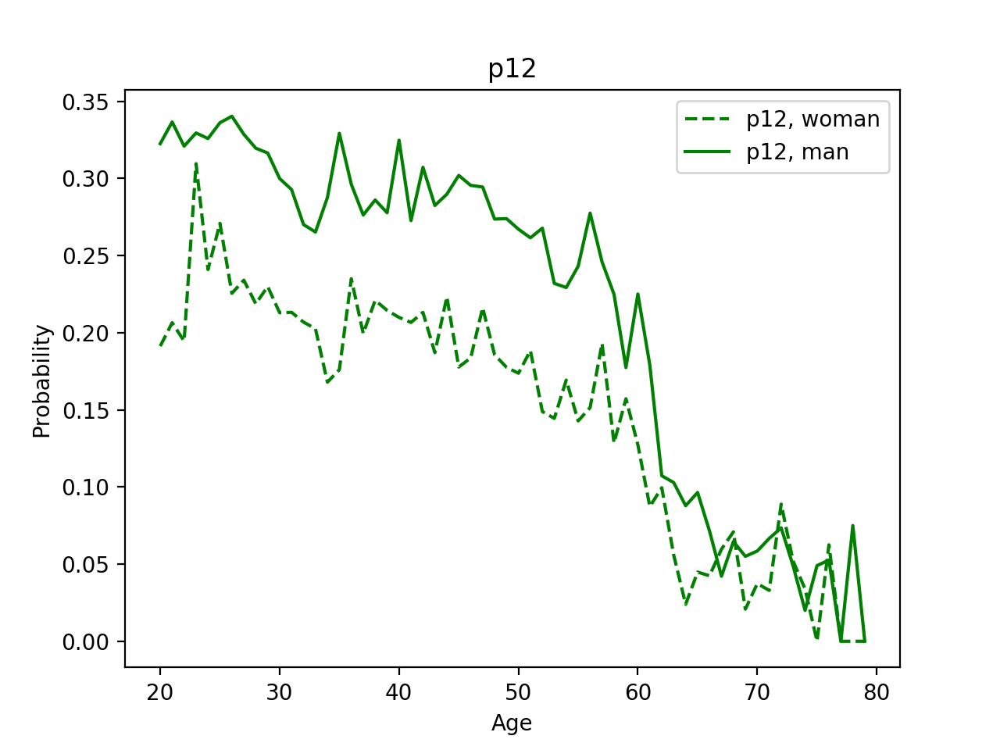

In [32]:
%matplotlib notebook
plt.plot(age,wq12,color='green', linestyle='dashed',label='p12, woman')
plt.plot(age,q12,color='green', label='p12, man')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p12')
plt.legend()

## Findings:
1. Women's upward probability is significantly lower than that of men.
2. The probability of downward transition is similar between men and women.

In [33]:
from bokeh.layouts import widgetbox
from bokeh.layouts import column
from bokeh.models import CustomJS, ColumnDataSource, MultiSelect
from bokeh.plotting import figure, output_file, show
import pandas as pd
from bokeh.io import output_file, show
from bokeh.models.widgets import CheckboxGroup
import numpy as np
from bokeh.layouts import row, column
from bokeh.models import CustomJS, Slider
from bokeh.plotting import figure, output_file, show, ColumnDataSource

output_file("wifematrix.html")
wp = figure(width=1000, height=700, x_axis_type="datetime")
wp11=wq11
wp12=wq12
wp13=wq13
wp14=wq14
wp21=wq21
wp22=wq22
wp23=wq23
wp24=wq24
wp31=wq31
wp32=wq32
wp33=wq33
wp34=wq34
wp41=wq41
wp42=wq42
wp43=wq43
wp44=wq44
plots=[]
x=age
color=['green', 'orange', 'yellow', 'blue',\
       'purple', 'cyan', 'pink', 'black', 'chocolate', \
       'red', 'gray', 'brown', 'burlywood', 'cadetblue', 'chartreuse','navy']
allp=[wp11,wp12,wp13,wp14,wp21,wp22,wp23,wp24,wp31,wp32,wp33,wp34,wp41,wp42,wp43,wp44]
strp=["p11", "p12", "p13",'p14',"p21", "p22", \
                                       "p23",'p24',"p31", "p32", "p33",'p34',\
                                       "p41", "p42", "p43",'p44']
for i in range(0,16):
    source = ColumnDataSource(data=dict(x=x, y=allp[i]))
    plt = wp.line('x', 'y', line_width=2,  alpha=0.8, color=color[i],source=source,legend=strp[i])
    plots.append(plt)
checkbox_groupwife = CheckboxGroup(labels=["p11", "p12", "p13",'p14',"p21", "p22", \
                                       "p23",'p24',"p31", "p32", "p33",'p34',\
                                       "p41", "p42", "p43",'p44'], active=list(range(0,16)))
args=dict(line0=plots[0],line1=plots[1], line2=plots[2], line3=plots[3],line4=plots[4], line5=plots[5], line6=plots[6],\
         line7=plots[7], line8=plots[8], line9=plots[9],line10=plots[10], line11=plots[11], line12=plots[12],\
         line13=plots[13], line14=plots[14], line15=plots[15])
checkbox_groupwife.callback = CustomJS(args = args,  code=""" 
        //console.log(cb_obj.active);
        line0.visible = false;
        line1.visible = false;
        line2.visible = false;
        line3.visible = false;
        line4.visible = false;
        line5.visible = false;
        line6.visible = false;
        line7.visible = false;
        line8.visible = false;
        line9.visible = false;
        line10.visible = false;
        line11.visible = false;
        line12.visible = false;
        line13.visible = false;
        line14.visible = false;
        line15.visible = false;

        for (i in cb_obj.active) {
            //console.log(cb_obj.active[i]);
            if (cb_obj.active[i] == 0) {
                line0.visible = true;
            } else if (cb_obj.active[i] == 1) {
                line1.visible = true;
            } else if (cb_obj.active[i] == 2) {
                line2.visible = true;
            } else if (cb_obj.active[i] == 3) {
                line3.visible = true;
            } else if (cb_obj.active[i] == 4) {
                line4.visible = true;
            } else if (cb_obj.active[i] == 5) {
                line5.visible = true;
            } else if (cb_obj.active[i] == 6) {
                line6.visible = true;
            } else if (cb_obj.active[i] == 7) {
                line7.visible = true;
            } else if (cb_obj.active[i] == 8) {
                line8.visible = true;
            } else if (cb_obj.active[i] == 9) {
                line9.visible = true;
            } else if (cb_obj.active[i] == 10) {
                line10.visible = true;
            } else if (cb_obj.active[i] == 11) {
                line11.visible = true;
            } else if (cb_obj.active[i] == 12) {
                line12.visible = true;
            } else if (cb_obj.active[i] == 13) {
                line13.visible = true;
            } else if (cb_obj.active[i] == 14) {
                line14.visible = true;
            } else if (cb_obj.active[i] == 15) {
                line15.visible = true;
            }
        }
    """)

layoutw = row(wp, widgetbox(checkbox_groupwife), sizing_mode='fixed')

show(layoutw)

1. For women, the probability of downward movement remains roughly constant across age.
2. For women, the probability of upward movement remain roughly constant between 20 and 40 years old, but shows a decreasing trend after 40 years old.
3. Usually, upward probabilities are similar with the corresponding downward probabilities before 60 years old.
4. For women, $p_{11}$ also increases in age, which is the same as men, but $p_{44}$ is not significantly higher than other $p_{ii}$.
5. Women's upward probability is significantly lower than that of men.
6. The probability of downward transition is similar between men and women.

# 2. linking location variable

In [34]:
statedata = xlrd.open_workbook('/Users/fulinguo/Desktop/chetty.xlsx')
table1 = statedata.sheets()[0]
nrows1 = table1.nrows
columns1=table1.row_values(0)
state0=[]
for i in range(1,nrows1):
    state0.append(table1.row_values(i))
state0=np.array(state0)
state0=pd.DataFrame(state0,columns=columns1)
state0['Gini'] = state0['Gini'].astype(float)
state0['Violent Crime Rate'] = pd.to_numeric(state0['Violent Crime Rate'],errors='coerce')
state0['High School Dropout Rate (Income Adjusted)'] = pd.to_numeric(state0['High School Dropout Rate (Income Adjusted)'],errors='coerce')

In [35]:
stateinf=state0.groupby('State')[['Gini', 'Violent Crime Rate','High School Dropout Rate (Income Adjusted)']].mean()
stateinf['inequality']=stateinf['Gini']>=stateinf['Gini'].median()
stateinf['violent']=stateinf['Violent Crime Rate']>=stateinf['Violent Crime Rate'].median()
stateinf['education']=stateinf['High School Dropout Rate (Income Adjusted)']>=stateinf['High School Dropout Rate (Income Adjusted)'].median()
statecodes=[50,1,3,2,4,5,6,8,7,9,10,51,14,11,12,13,15,16,17,20,19,18,21,22,24,23,25,32,33,26,28,29,30,27,31,34,35,36,37,
           38, 39,40,41,42,43,45,44,46,48,47,49]
stateinf['code']=statecodes
stateinf['education']['CT']=True
stateinf['education']['VT']=True # since lack of high school dropout rate data, using colleges per capital for these two states

/Users/fulinguo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/fulinguo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


In [36]:
lll=[]
llh=[]
lhl=[]
lhh=[]
hll=[]
hlh=[]
hhl=[]
hhh=[]
for j in range(len(stateinf)):
    ine=stateinf['inequality'][j]
    vio=stateinf['violent'][j]
    edu=stateinf['education'][j]
    if ine & vio & edu:
        hhh.append(stateinf['code'][j])
    elif ine & vio & (edu==False):
        hhl.append(stateinf['code'][j])
    elif ine & (vio==False) & edu:
        hlh.append(stateinf['code'][j])
    elif ine & (vio==False) & (edu==False):
        hll.append(stateinf['code'][j])
    elif (ine==False) & vio & edu:
        lhh.append(stateinf['code'][j])
    elif (ine==False) & (vio==False) & edu:
        llh.append(stateinf['code'][j])
    elif (ine==False) & vio & (edu==False):
        lhl.append(stateinf['code'][j])
    else:
        lll.append(stateinf['code'][j])

In [37]:
print('High inequality, High crime rate, High high school drop out rate:',hhh)
print('High inequality, High crime rate, Low high school drop out rate:',hhl)
print('High inequality, Low crime rate, High high school drop out rate:',hlh)
print('High inequality, Low crime rate, Low high school drop out rate:',hll)
print('Low inequality, High crime rate, High high school drop out rate:',lhh)
print('Low inequality, Low crime rate, High high school drop out rate:',llh)
print('Low inequality, High crime rate, Low high school drop out rate:',lhl)
print('Low inequality, Low crime rate, Low high school drop out rate:',lll)

High inequality, High crime rate, High high school drop out rate: [1, 3, 2, 6, 7, 9, 10, 17, 20, 19, 23, 32, 38]
High inequality, High crime rate, Low high school drop out rate: [4, 29, 30, 31, 39, 41, 42]
High inequality, Low crime rate, High high school drop out rate: [8, 16, 28, 46]
High inequality, Low crime rate, Low high school drop out rate: [45, 47]
Low inequality, High crime rate, High high school drop out rate: [50, 12, 13, 35]
Low inequality, Low crime rate, High high school drop out rate: [51, 11, 24, 25, 44, 49]
Low inequality, High crime rate, Low high school drop out rate: [27, 37]
Low inequality, Low crime rate, Low high school drop out rate: [5, 14, 15, 18, 21, 22, 33, 26, 34, 36, 40, 43, 48]


In [38]:
headmarhhh=[[0]*16]*60
headmarhhl=[[0]*16]*60
headmarhlh=[[0]*16]*60
headmarhll=[[0]*16]*60
headmarlhh=[[0]*16]*60
headmarllh=[[0]*16]*60
headmarlhl=[[0]*16]*60
headmarlll=[[0]*16]*60
headmarhhh=np.array(headmarhhh)
headmarhhl=np.array(headmarhhl)
headmarhlh=np.array(headmarhlh)
headmarhll=np.array(headmarhll)
headmarlhh=np.array(headmarlhh)
headmarllh=np.array(headmarllh)
headmarlhl=np.array(headmarlhl)
headmarlll=np.array(headmarlll)

In [39]:
for i in range(len(income)):
    for j in range(len(headage_ind)-1):
        type=16
        age=income.values[i][hanum[j]]
        inc=income.values[i][hinum[j]]
        age2=income.values[i][hanum[j+1]] # set the period interval be 1 year
        inc2=income.values[i][hinum[j+1]]
        loc=income.values[i][stanum[j]]
        sex=income.values[i][hgnum[j]]
            #elif j>=23:
            #age=income.values[i][4+5*j]
            #inc=income.values[i][5+5*j]
            #age2=income.values[i][4+5*(j+1)]
            #inc2=income.values[i][5+5*(j+1)]
        if (age>=20) & (age2>=20) & (age<=79) &(age2<=80) & (inc!=0) & (inc2!=0) & (sex==1):
            if (inc<headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=0
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=1
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=2
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=3
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=4
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=5
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=6
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=7
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2<headinc_quan[j+1][2]):
                type=8
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=9
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=10
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][0]):
                type=11
            elif (inc>=headinc_quan[j][0]) & (inc2<headinc_quan[j+1][2]):
                type=12
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=13
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=14
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][0]):
                type=15
            if loc in hhh:
                headmarhhh[int(age)-20][type]+=1
            if loc in hhl:
                headmarhhl[int(age)-20][type]+=1
            if loc in hlh:
                headmarhlh[int(age)-20][type]+=1
            if loc in hll:
                headmarhll[int(age)-20][type]+=1
            if loc in lhh:
                headmarlhh[int(age)-20][type]+=1
            if loc in llh:
                headmarllh[int(age)-20][type]+=1
            if loc in lhl:
                headmarlhl[int(age)-20][type]+=1
            if loc in lll:
                headmarlll[int(age)-20][type]+=1

In [40]:
headmarhhh=headmarhhh.reshape(60,4,4)
headmarhhl=headmarhhl.reshape(60,4,4)
headmarhll=headmarhll.reshape(60,4,4)
headmarhlh=headmarhlh.reshape(60,4,4)
headmarlhh=headmarlhh.reshape(60,4,4)
headmarllh=headmarllh.reshape(60,4,4)
headmarlhl=headmarlhl.reshape(60,4,4)
headmarlll=headmarlll.reshape(60,4,4)
headmarkovhhh=[]
headmarkovhhl=[]
headmarkovhlh=[]
headmarkovhll=[]
headmarkovlhh=[]
headmarkovllh=[]
headmarkovlhl=[]
headmarkovlll=[]
for i in range(len(headmarhhh)):
    for j in range(4):
        sum_quan=sum(headmarhhh[i][j])
        headmarhhh[i][j]/max(sum_quan,0.1)
        headmarkovhhh.append(headmarhhh[i][j]/max(sum_quan,0.1))
headmarkovhhh=np.array(headmarkovhhh)
headmarkovhhh=headmarkovhhh.reshape(60,4,4)
for i in range(len(headmarhhl)):
    for j in range(4):
        sum_quan=sum(headmarhhl[i][j])
        headmarhhl[i][j]/max(sum_quan,0.1)
        headmarkovhhl.append(headmarhhl[i][j]/max(sum_quan,0.1))
headmarkovhhl=np.array(headmarkovhhl)
headmarkovhhl=headmarkovhhl.reshape(60,4,4)
for i in range(len(headmarhll)):
    for j in range(4):
        sum_quan=sum(headmarhll[i][j])
        headmarhll[i][j]/max(sum_quan,0.1)
        headmarkovhll.append(headmarhll[i][j]/max(sum_quan,0.1))
headmarkovhll=np.array(headmarkovhll)
headmarkovhll=headmarkovhll.reshape(60,4,4)
for i in range(len(headmarhlh)):
    for j in range(4):
        sum_quan=sum(headmarhlh[i][j])
        headmarhlh[i][j]/max(sum_quan,0.1)
        headmarkovhlh.append(headmarhlh[i][j]/max(sum_quan,0.1))
headmarkovhlh=np.array(headmarkovhlh)
headmarkovhlh=headmarkovhlh.reshape(60,4,4)
for i in range(len(headmarlhh)):
    for j in range(4):
        sum_quan=sum(headmarlhh[i][j])
        headmarlhh[i][j]/max(sum_quan,0.1)
        headmarkovlhh.append(headmarlhh[i][j]/max(sum_quan,0.1))
headmarkovlhh=np.array(headmarkovlhh)
headmarkovlhh=headmarkovlhh.reshape(60,4,4)
for i in range(len(headmarllh)):
    for j in range(4):
        sum_quan=sum(headmarllh[i][j])
        headmarllh[i][j]/max(sum_quan,0.1)
        headmarkovllh.append(headmarllh[i][j]/max(sum_quan,0.1))
headmarkovllh=np.array(headmarkovllh)
headmarkovllh=headmarkovllh.reshape(60,4,4)
for i in range(len(headmarlhl)):
    for j in range(4):
        sum_quan=sum(headmarlhl[i][j])
        headmarlhl[i][j]/max(sum_quan,0.1)
        headmarkovlhl.append(headmarlhl[i][j]/max(sum_quan,0.1))
headmarkovlhl=np.array(headmarkovlhl)
headmarkovlhl=headmarkovlhl.reshape(60,4,4)
for i in range(len(headmarlll)):
    for j in range(4):
        sum_quan=sum(headmarlll[i][j])
        headmarlll[i][j]/max(sum_quan,0.1)
        headmarkovlll.append(headmarlll[i][j]/max(sum_quan,0.1))
headmarkovlll=np.array(headmarkovlll)
headmarkovlll=headmarkovlll.reshape(60,4,4)

<IPython.core.display.Javascript object>


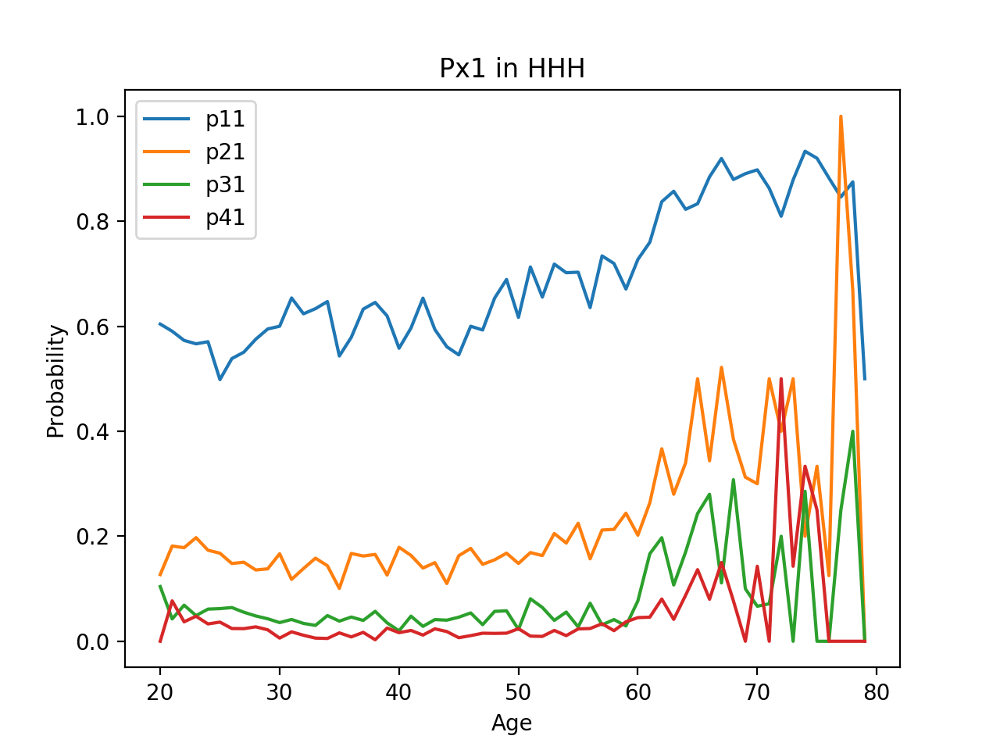

In [41]:
import matplotlib.pyplot as plt
hm11hhh=[]
hm21hhh=[]
hm31hhh=[]
hm41hhh=[]
for i in headmarkovhhh:
    hm11hhh.append(i[0][0])
    hm21hhh.append(i[1][0])
    hm31hhh.append(i[2][0])
    hm41hhh.append(i[3][0])
age=np.arange(20,20+len(hm11hhh))
headmarkov1.shape
%matplotlib notebook
plt.plot(age,hm11hhh,label='p11')
plt.plot(age,hm21hhh,label='p21')
plt.plot(age,hm31hhh,label='p31')
plt.plot(age,hm41hhh,label='p41')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px1 in HHH')
plt.legend()

<IPython.core.display.Javascript object>


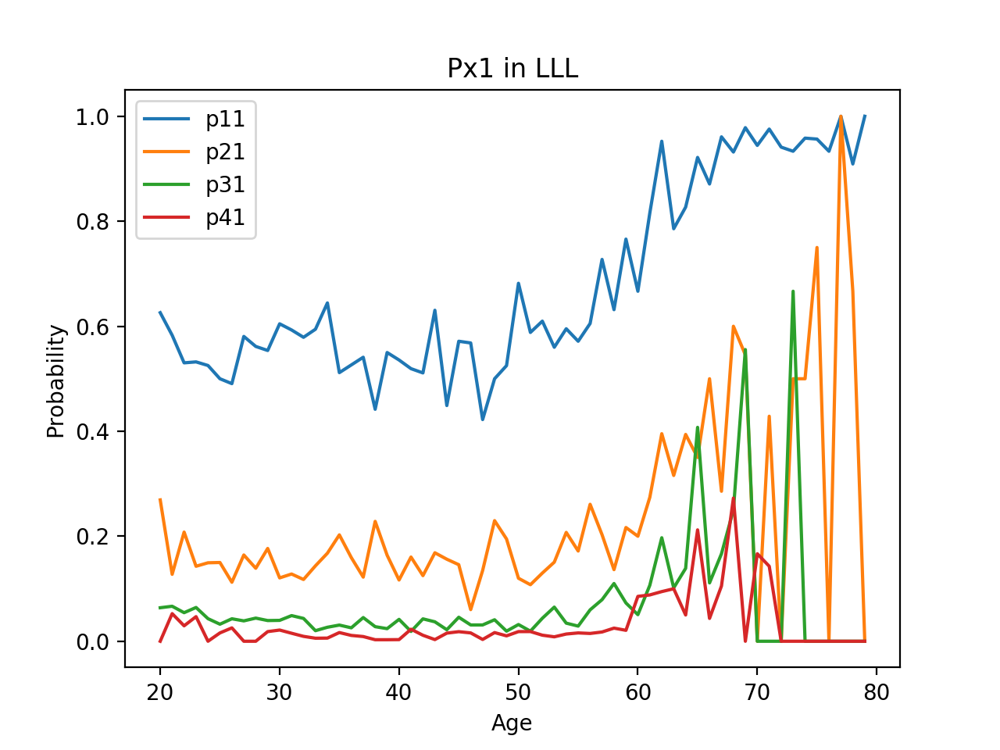

In [42]:
import matplotlib.pyplot as plt
hm11lll=[]
hm21lll=[]
hm31lll=[]
hm41lll=[]
for i in headmarkovlll:
    hm11lll.append(i[0][0])
    hm21lll.append(i[1][0])
    hm31lll.append(i[2][0])
    hm41lll.append(i[3][0])
age=np.arange(20,20+len(hm11lll))
%matplotlib notebook
plt.plot(age,hm11lll,label='p11')
plt.plot(age,hm21lll,label='p21')
plt.plot(age,hm31lll,label='p31')
plt.plot(age,hm41lll,label='p41')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px1 in LLL')
plt.legend()

<IPython.core.display.Javascript object>


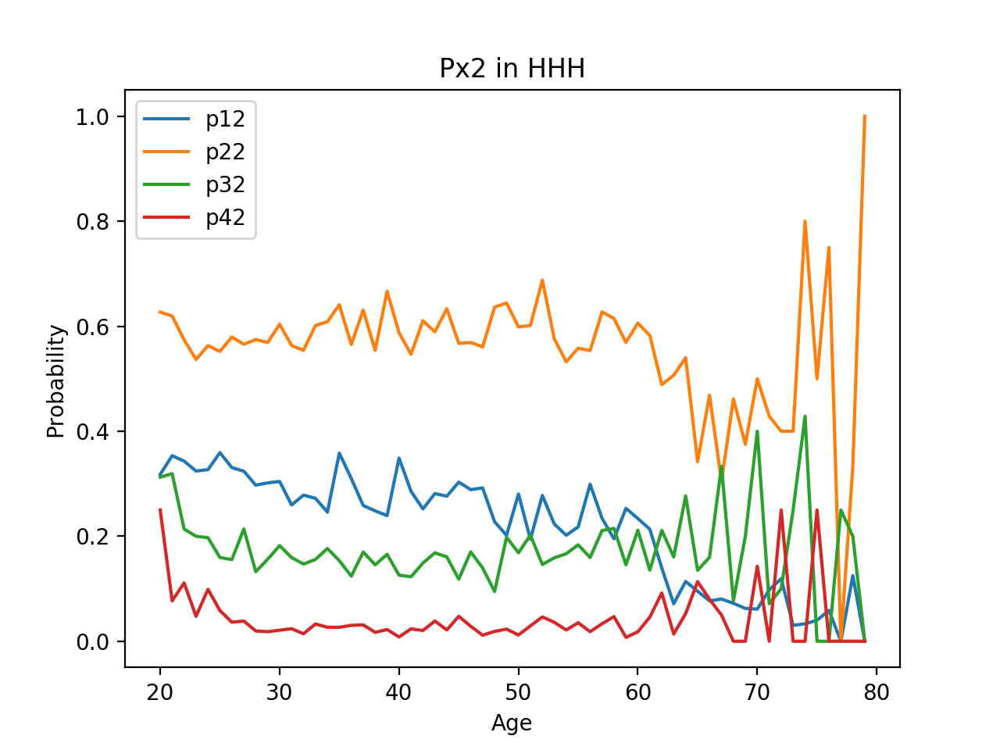

In [43]:
import matplotlib.pyplot as plt
hm12hhh=[]
hm22hhh=[]
hm32hhh=[]
hm42hhh=[]
for i in headmarkovhhh:
    hm12hhh.append(i[0][1])
    hm22hhh.append(i[1][1])
    hm32hhh.append(i[2][1])
    hm42hhh.append(i[3][1])
age=np.arange(20,20+len(hm11hhh))
headmarkov1.shape
%matplotlib notebook
plt.plot(age,hm12hhh,label='p12')
plt.plot(age,hm22hhh,label='p22')
plt.plot(age,hm32hhh,label='p32')
plt.plot(age,hm42hhh,label='p42')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px2 in HHH')
plt.legend()

<IPython.core.display.Javascript object>


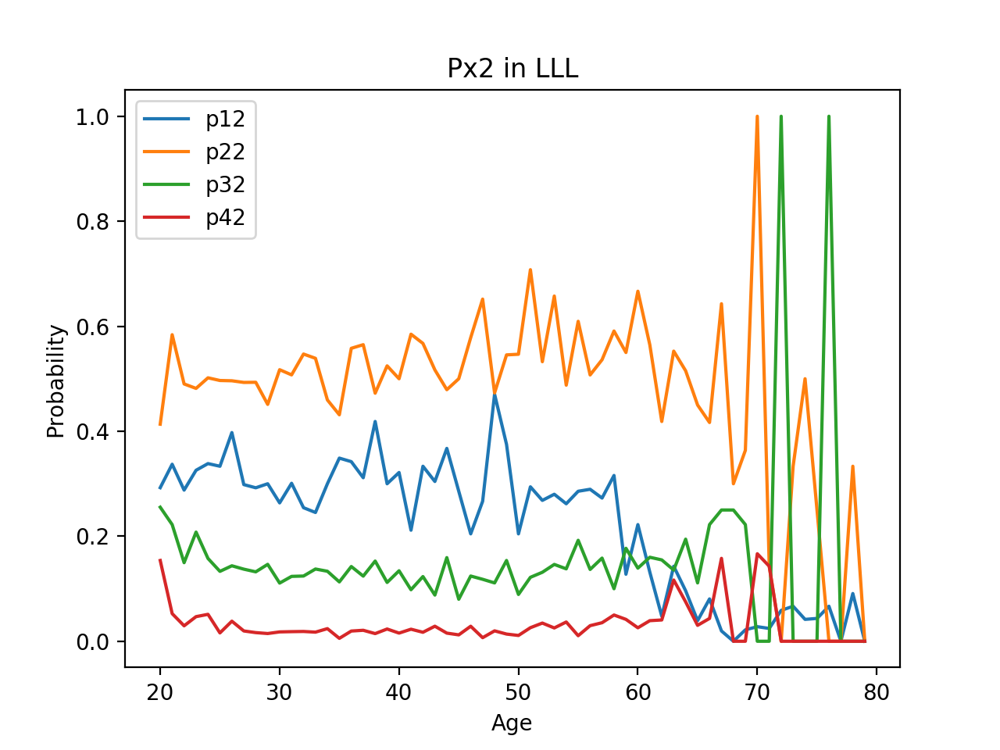

In [44]:
import matplotlib.pyplot as plt
hm12lll=[]
hm22lll=[]
hm32lll=[]
hm42lll=[]
for i in headmarkovlll:
    hm12lll.append(i[0][1])
    hm22lll.append(i[1][1])
    hm32lll.append(i[2][1])
    hm42lll.append(i[3][1])
age=np.arange(20,20+len(hm11lll))
%matplotlib notebook
plt.plot(age,hm12lll,label='p12')
plt.plot(age,hm22lll,label='p22')
plt.plot(age,hm32lll,label='p32')
plt.plot(age,hm42lll,label='p42')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px2 in LLL')
plt.legend()

<IPython.core.display.Javascript object>


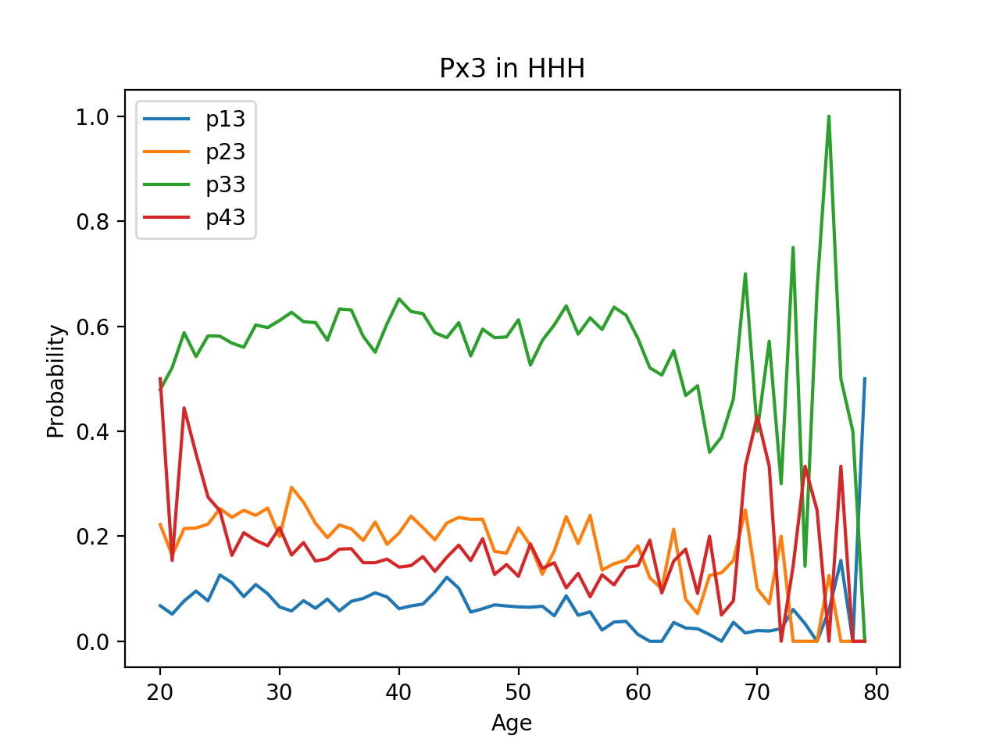

In [45]:
import matplotlib.pyplot as plt
hm13hhh=[]
hm23hhh=[]
hm33hhh=[]
hm43hhh=[]
for i in headmarkovhhh:
    hm13hhh.append(i[0][2])
    hm23hhh.append(i[1][2])
    hm33hhh.append(i[2][2])
    hm43hhh.append(i[3][2])
age=np.arange(20,20+len(hm11hhh))
%matplotlib notebook
plt.plot(age,hm13hhh,label='p13')
plt.plot(age,hm23hhh,label='p23')
plt.plot(age,hm33hhh,label='p33')
plt.plot(age,hm43hhh,label='p43')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px3 in HHH')
plt.legend()

<IPython.core.display.Javascript object>


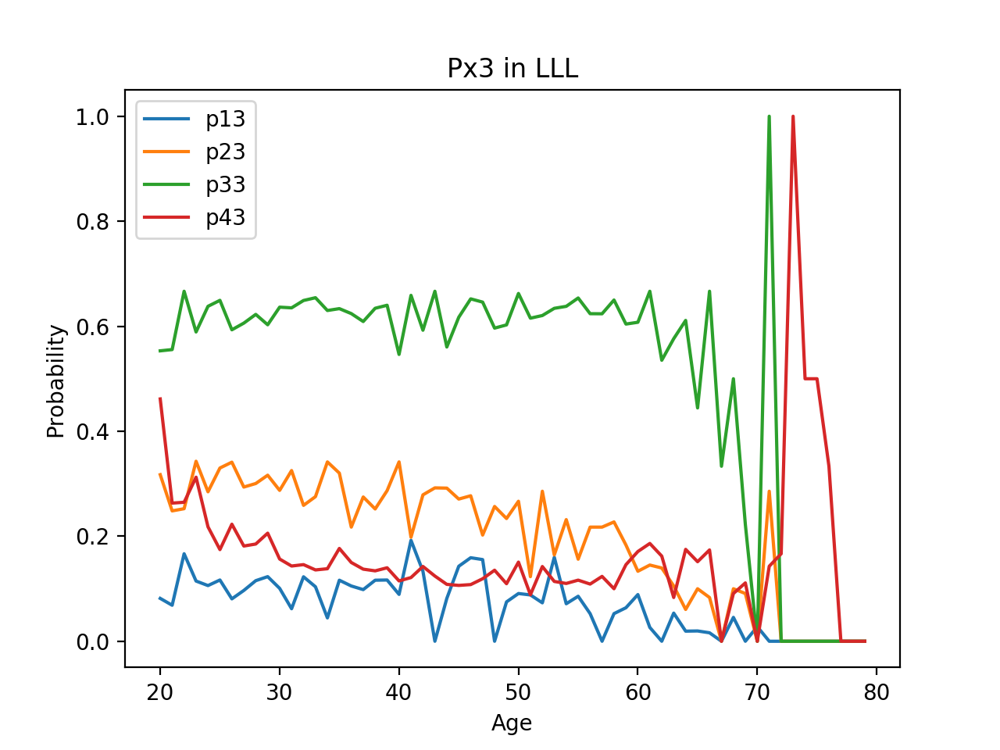

In [46]:
import matplotlib.pyplot as plt
hm13lll=[]
hm23lll=[]
hm33lll=[]
hm43lll=[]
for i in headmarkovlll:
    hm13lll.append(i[0][2])
    hm23lll.append(i[1][2])
    hm33lll.append(i[2][2])
    hm43lll.append(i[3][2])
age=np.arange(20,20+len(hm11lll))
%matplotlib notebook
plt.plot(age,hm13lll,label='p13')
plt.plot(age,hm23lll,label='p23')
plt.plot(age,hm33lll,label='p33')
plt.plot(age,hm43lll,label='p43')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px3 in LLL')
plt.legend()

<IPython.core.display.Javascript object>


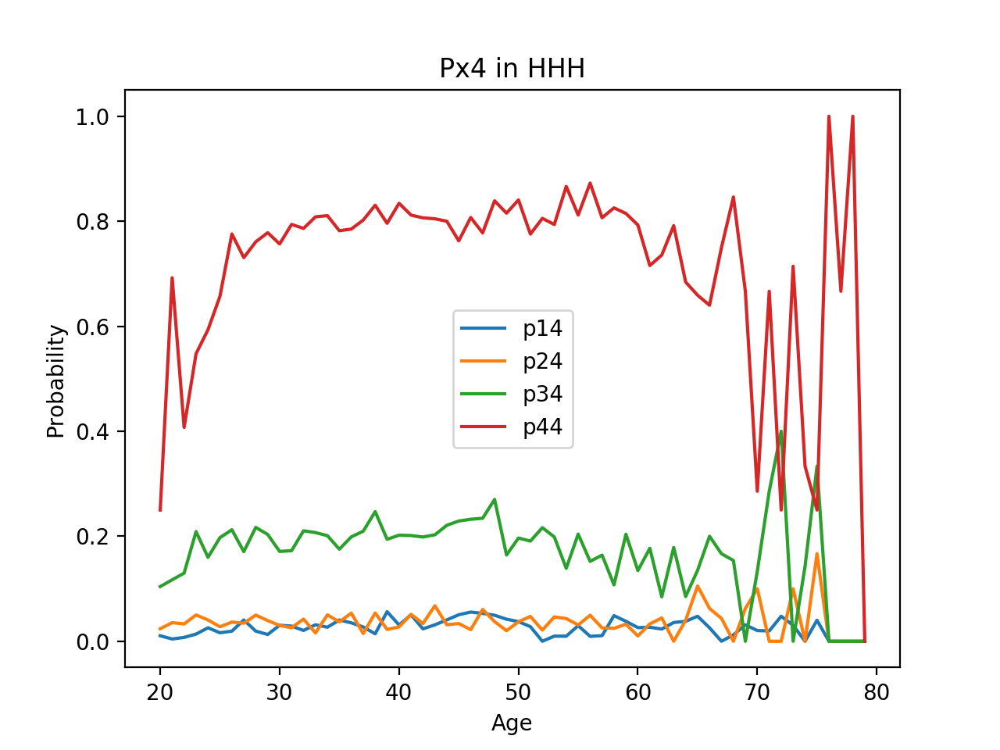

In [47]:
import matplotlib.pyplot as plt
hm14hhh=[]
hm24hhh=[]
hm34hhh=[]
hm44hhh=[]
for i in headmarkovhhh:
    hm14hhh.append(i[0][3])
    hm24hhh.append(i[1][3])
    hm34hhh.append(i[2][3])
    hm44hhh.append(i[3][3])
age=np.arange(20,20+len(hm11hhh))
%matplotlib notebook
plt.plot(age,hm14hhh,label='p14')
plt.plot(age,hm24hhh,label='p24')
plt.plot(age,hm34hhh,label='p34')
plt.plot(age,hm44hhh,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px4 in HHH')
plt.legend()


<IPython.core.display.Javascript object>


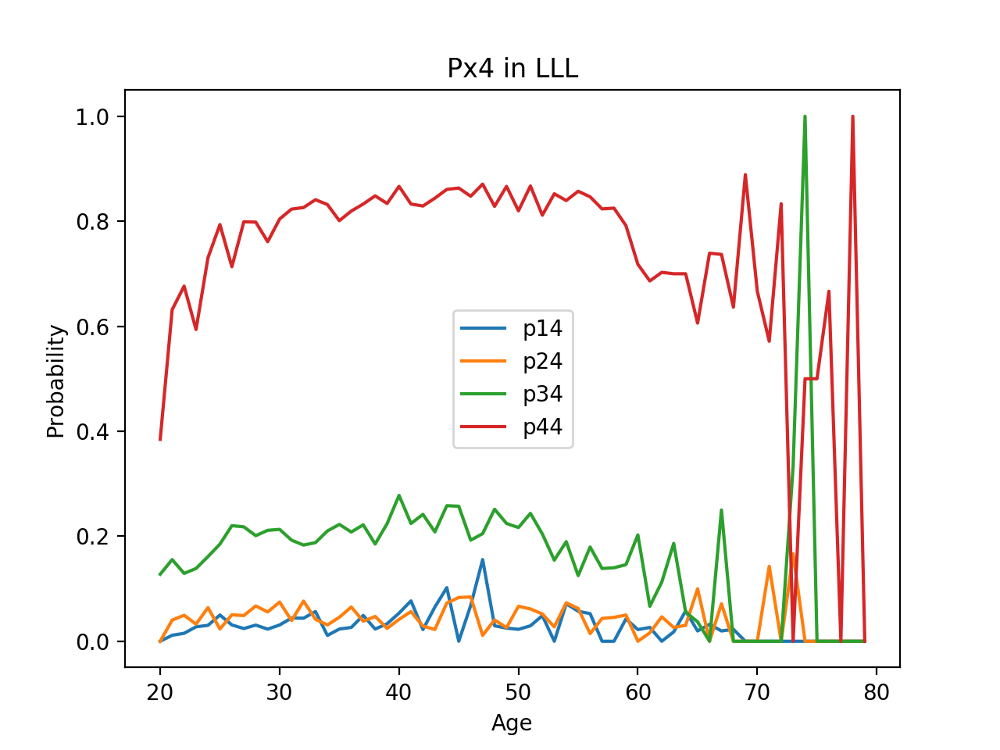

In [48]:
import matplotlib.pyplot as plt
hm14lll=[]
hm24lll=[]
hm34lll=[]
hm44lll=[]
for i in headmarkovlll:
    hm14lll.append(i[0][3])
    hm24lll.append(i[1][3])
    hm34lll.append(i[2][3])
    hm44lll.append(i[3][3])
age=np.arange(20,20+len(hm11hhh))
%matplotlib notebook
plt.plot(age,hm14lll,label='p14')
plt.plot(age,hm24lll,label='p24')
plt.plot(age,hm34lll,label='p34')
plt.plot(age,hm44lll,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px4 in LLL')
plt.legend()


In [49]:
age=np.arange(20,20+len(hm11hhh))


<IPython.core.display.Javascript object>


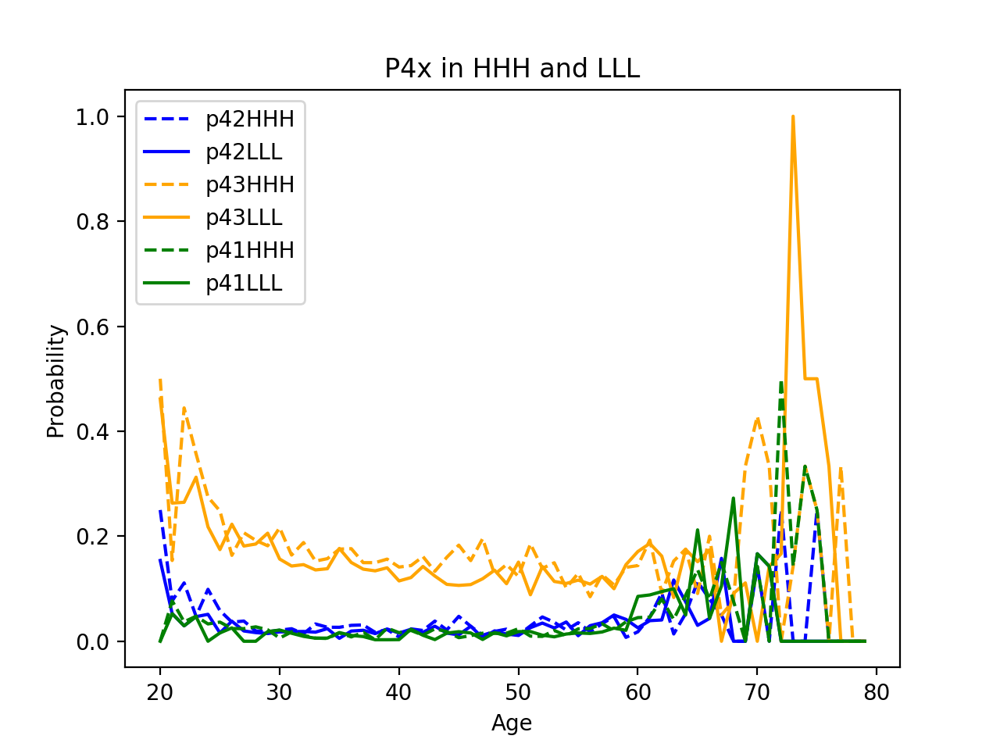

In [50]:
%matplotlib notebook
plt.plot(age,hm42hhh,label='p42HHH',color='blue',linestyle='dashed')
plt.plot(age,hm42lll,label='p42LLL',color='blue')
plt.plot(age,hm43hhh,label='p43HHH',color='orange',linestyle='dashed')
plt.plot(age,hm43lll,label='p43LLL',color='orange')
plt.plot(age,hm41hhh,label='p41HHH',color='green',linestyle='dashed')
plt.plot(age,hm41lll,label='p41LLL',color='green')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('P4x in HHH and LLL')
plt.legend()


<IPython.core.display.Javascript object>


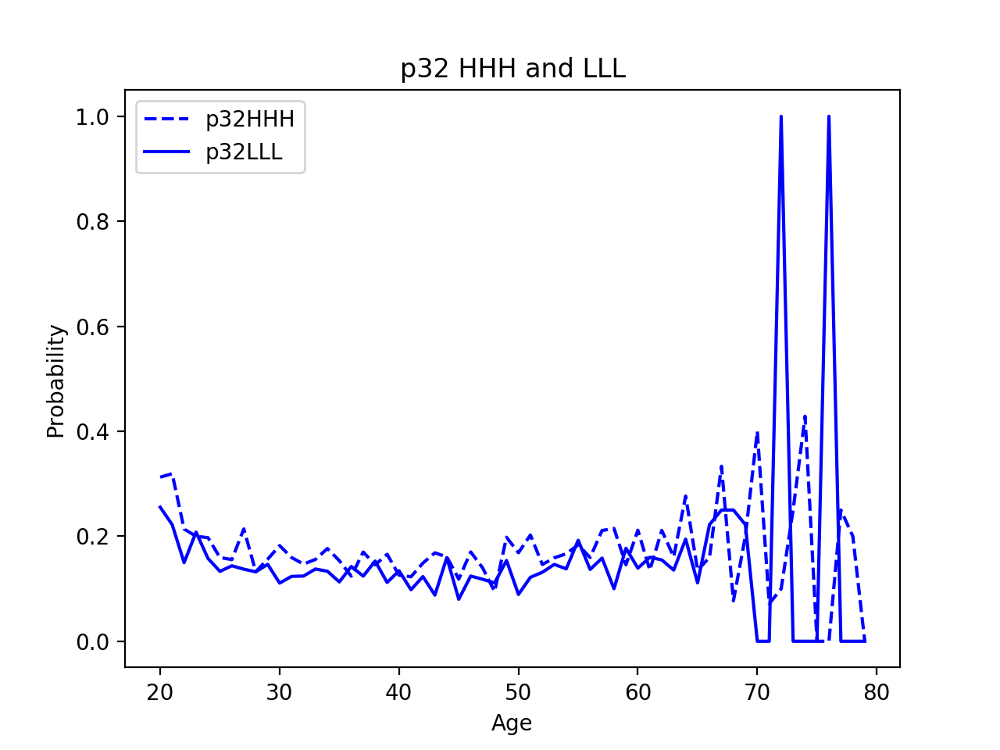

In [51]:
%matplotlib notebook
plt.plot(age,hm32hhh,label='p32HHH',color='blue',linestyle='dashed')
plt.plot(age,hm32lll,label='p32LLL',color='blue')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p32 HHH and LLL')
plt.legend()


<IPython.core.display.Javascript object>


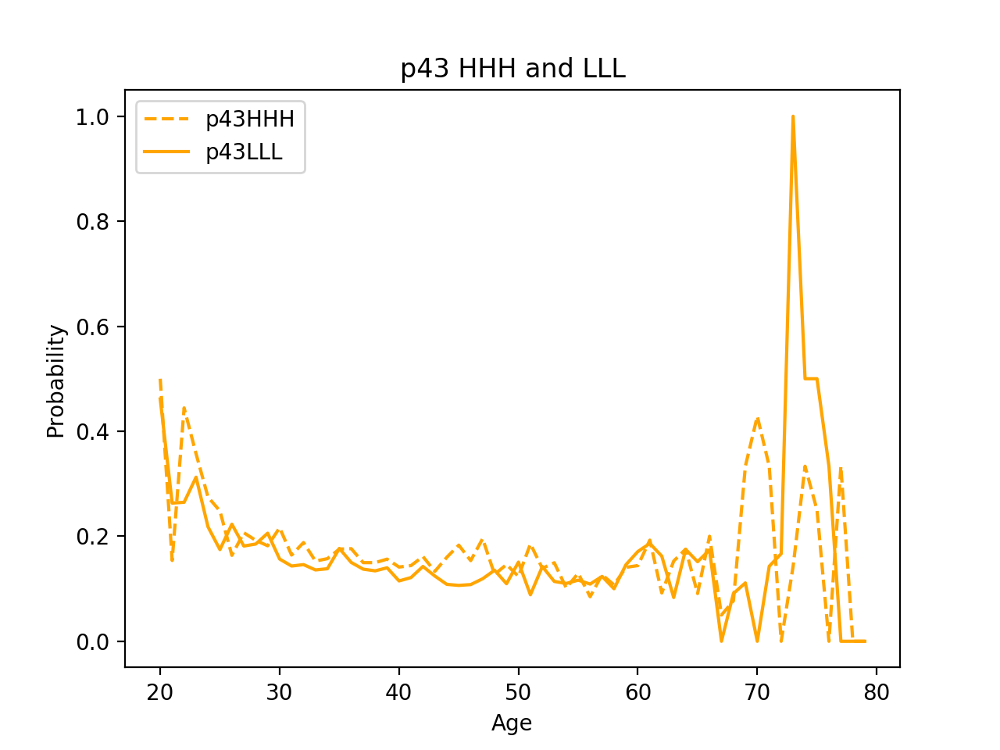

In [52]:
%matplotlib notebook
plt.plot(age,hm43hhh,label='p43HHH',color='orange',linestyle='dashed')
plt.plot(age,hm43lll,label='p43LLL',color='orange')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p43 HHH and LLL')
plt.legend()

<IPython.core.display.Javascript object>


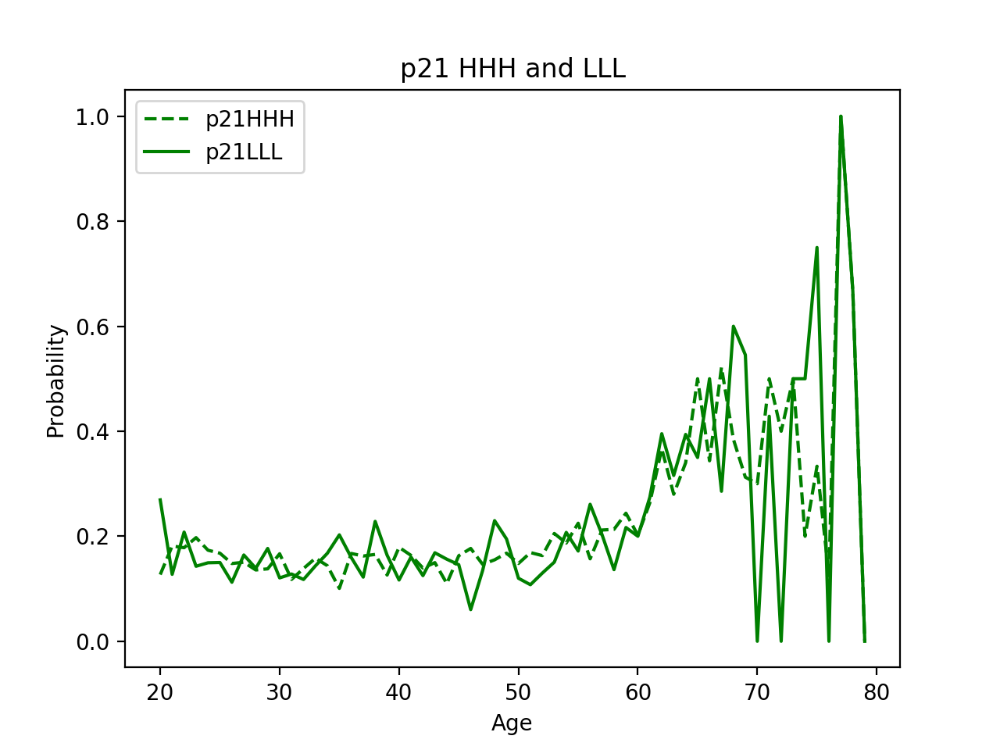

In [64]:
%matplotlib notebook
plt.plot(age,hm21hhh,label='p21HHH',color='green',linestyle='dashed')
plt.plot(age,hm21lll,label='p21LLL',color='green')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('p21 HHH and LLL')
plt.legend()

## Findings:
1. The probability of men's downward transition in HHH and LLL decreases slightly between 20 and 30 years old, and remain roughly constant between 30 and 60 years old.
2. The probability of men's downward transition in HHH (High inequality, High crime rate, High high school drop out rate) is slightly higher (p43, p32) than that in LLL.

In [53]:
print('The summation of p42_hhh w.r.t age:',sum(hm42hhh))
print('The summation of p42_lll w.r.t age:',sum(hm42lll))

The summation of p42_hhh w.r.t age: 2.6381585189352275
The summation of p42_lll w.r.t age: 1.9385075197078405


In [54]:
df=[]
headBigmarkov=[headmarkovhhh,headmarkovhlh,headmarkovhhl,headmarkovhll,headmarkovlhh,headmarkovllh,headmarkovlhl,headmarkovlll]

In [55]:
for i in range(8):
    for j in range(60):
        df.extend([headBigmarkov[i][j][0][::-1],headBigmarkov[i][j][1][::-1],headBigmarkov[i][j][2][::-1],headBigmarkov[i][j][3][::-1]])

In [56]:
columns=['Q4','Q3','Q2','Q1']
index=[]
for i in range(8):
    for j in range(60):
        a1='Q1'+'_'+str(i)+'_'+str(j+20)
        a2='Q2'+'_'+str(i)+'_'+str(j+20)
        a3='Q3'+'_'+str(i)+'_'+str(j+20)
        a4='Q4'+'_'+str(i)+'_'+str(j+20)
        a=[a1,a2,a3,a4]
        index.extend(a)

In [57]:
df=pd.DataFrame(df,columns=columns,index=index)
df.index.name = 'Period1'
df.columns.name = 'Period2'
df
df = df.stack().rename("value").reset_index()


In [58]:
df0=df[0:16*60]


In [59]:
x=np.array([1,2,3,4])
y=np.array([1,2,3,4])
%matplotlib notebook
def f(age, x, y):
    #z=[[],[],[],[]]
    #for i in x:
        #for j in y:
            #z[i].append(markovhhh[0][i][j])
    z=headmarkov1[age-20][x-1][y-1]
    return z
def plot3d(age):
    X, Y = np.meshgrid(x, y)
    z=f(age,x,y)
    %matplotlib inline
    ax = plt.axes(projection='3d')
    ax.plot_surface(X, Y, z, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
    ax.set_title('Probability of income transition')
    print('age=', age)
age_slider=wg.IntSlider(value=20,min=20,max=79,step=1)
wg.interact(plot3d,age=age_slider)


interactive(children=(IntSlider(value=20, description='age', max=79, min=20), Output()), _dom_classes=('widget…

<function __main__.plot3d(age)>

In [60]:
def heat(age):
    a=headmarkov1[age-20]
    sns.heatmap(a, annot=True,  linewidths=.5,xticklabels=['Q1','Q2','Q3','Q4'],yticklabels=['Q1','Q2','Q3','Q4'])
    print('age=', age)
    plt.show()
age2_slider=wg.IntSlider(value=20,min=20,max=79,step=1)
wg.interact(heat,age=age2_slider)


interactive(children=(IntSlider(value=20, description='age', max=79, min=20), Output()), _dom_classes=('widget…

<function __main__.heat(age)>

In [61]:
from mpl_toolkits.mplot3d import Axes3D
type_wg=wg.RadioButtons(
    options=['HHH', 'HLH', 'HHL','HLL','LHH','LLH','LHL','LLL'],
#     value='pineapple',
    description='type:',
    disabled=False
)
x=np.array([1,2,3,4])
y=np.array([1,2,3,4])
%matplotlib notebook
def f(age, ty,x, y):
    t=0
    if ty=='HHH':
        t=0
    elif ty=='HLH':
        t=1
    elif ty=='HHL':
        t=2
    elif ty=='HLL':
        t=3
    elif ty=='LHH':
        t=4
    elif ty=='LLH':
        t=5
    elif ty=='LHL':
        t=6
    elif ty=='LLL':
        t=7
    z=headBigmarkov[t][age-20][x-1][y-1]
    return z
def plot3d1(ty,age):
    X, Y = np.meshgrid(x, y)
    z=f(age,ty,x,y)
    %matplotlib inline
    ax = plt.axes(projection='3d')
    ax.plot_surface(X, Y, z, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
    ax.set_title('Probability of income transition')
    if ty=='HHH':
        s='High inequality, High crime rate, High high school drop out rate'
    elif ty=='HHL':
        s='High inequality, High crime rate, Low high school drop out rate'
    elif ty=='HLH':
        s='High inequality, Low crime rate, High high school drop out rate'
    elif ty=='HLL':
        s='High inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHL':
        s='Low inequality, High crime rate, Low high school drop out rate'
    elif ty=='LLL':
        s='Low inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHH':
        s='Low inequality, High crime rate, High high school drop out rate'
    elif ty=='LLH':
        s='Low inequality, Low crime rate, High high school drop out rate'
    print('age=', age)
    print('type=',s)
age_slider=wg.IntSlider(value=20,min=20,max=79,step=1)
wg.interact(plot3d1,age=age_slider,ty=type_wg)

interactive(children=(RadioButtons(description='type:', options=('HHH', 'HLH', 'HHL', 'HLL', 'LHH', 'LLH', 'LH…

<function __main__.plot3d1(ty, age)>

In [62]:
def heat2(ty,age):
    if ty=='HHH':
        t=0
    elif ty=='HLH':
        t=1
    elif ty=='HHL':
        t=2
    elif ty=='HLL':
        t=3
    elif ty=='LHH':
        t=4
    elif ty=='LLH':
        t=5
    elif ty=='LHL':
        t=6
    elif ty=='LLL':
        t=7
    a=headBigmarkov[t][age-20]
    sns.heatmap(a, annot=True,  linewidths=.5,xticklabels=['Q1','Q2','Q3','Q4'],yticklabels=['Q1','Q2','Q3','Q4'])
    if ty=='HHH':
        s='High inequality, High crime rate, High high school drop out rate'
    elif ty=='HHL':
        s='High inequality, High crime rate, Low high school drop out rate'
    elif ty=='HLH':
        s='High inequality, Low crime rate, High high school drop out rate'
    elif ty=='HLL':
        s='High inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHL':
        s='Low inequality, High crime rate, Low high school drop out rate'
    elif ty=='LLL':
        s='Low inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHH':
        s='Low inequality, High crime rate, High high school drop out rate'
    elif ty=='LLH':
        s='Low inequality, Low crime rate, High high school drop out rate'
    print('age=', age)
    print('type=',s)
    plt.show()
age3_slider=wg.IntSlider(value=20,min=20,max=79,step=1)
type_wg3=wg.RadioButtons(
    options=['HHH', 'HLH', 'HHL','HLL','LHH','LLH','LHL','LLL'],
#     value='pineapple',
    description='type:',
    disabled=False
)
wg.interact(heat2,age=age3_slider,ty=type_wg3)


interactive(children=(RadioButtons(description='type:', options=('HHH', 'HLH', 'HHL', 'HLL', 'LHH', 'LLH', 'LH…

<function __main__.heat2(ty, age)>

### women

In [63]:
wifemarhhh=[[0]*16]*60
wifemarhhl=[[0]*16]*60
wifemarhlh=[[0]*16]*60
wifemarhll=[[0]*16]*60
wifemarlhh=[[0]*16]*60
wifemarllh=[[0]*16]*60
wifemarlhl=[[0]*16]*60
wifemarlll=[[0]*16]*60
wifemarhhh=np.array(wifemarhhh)
wifemarhhl=np.array(wifemarhhl)
wifemarhlh=np.array(wifemarhlh)
wifemarhll=np.array(wifemarhll)
wifemarlhh=np.array(wifemarlhh)
wifemarllh=np.array(wifemarllh)
wifemarlhl=np.array(wifemarlhl)
wifemarlll=np.array(wifemarlll)

In [64]:
for i in range(len(income)):
    for j in range(len(headage_ind)-1):
        type=16
        age=income.values[i][hanum[j]]
        inc=income.values[i][hinum[j]]
        age2=income.values[i][hanum[j+1]] # set the period interval be 1 year
        inc2=income.values[i][hinum[j+1]]
        loc=income.values[i][stanum[j]]
        sex=income.values[i][hgnum[j]]
            #elif j>=23:
            #age=income.values[i][4+5*j]
            #inc=income.values[i][5+5*j]
            #age2=income.values[i][4+5*(j+1)]
            #inc2=income.values[i][5+5*(j+1)]
        if (age>=20) & (age2>=20) & (age<=79) &(age2<=80) & (inc!=0) & (inc2!=0) & (sex==2):
            if (inc<headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=0
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=1
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=2
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=3
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=4
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=5
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=6
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=7
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2<headinc_quan[j+1][2]):
                type=8
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=9
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=10
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][0]):
                type=11
            elif (inc>=headinc_quan[j][0]) & (inc2<headinc_quan[j+1][2]):
                type=12
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=13
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=14
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][0]):
                type=15
            if loc in hhh:
                wifemarhhh[int(age)-20][type]+=1
            if loc in hhl:
                wifemarhhl[int(age)-20][type]+=1
            if loc in hlh:
                wifemarhlh[int(age)-20][type]+=1
            if loc in hll:
                wifemarhll[int(age)-20][type]+=1
            if loc in lhh:
                wifemarlhh[int(age)-20][type]+=1
            if loc in llh:
                wifemarllh[int(age)-20][type]+=1
            if loc in lhl:
                wifemarlhl[int(age)-20][type]+=1
            if loc in lll:
                wifemarlll[int(age)-20][type]+=1

In [65]:
wifemarhhh=wifemarhhh.reshape(60,4,4)
wifemarhhl=wifemarhhl.reshape(60,4,4)
wifemarhll=wifemarhll.reshape(60,4,4)
wifemarhlh=wifemarhlh.reshape(60,4,4)
wifemarlhh=wifemarlhh.reshape(60,4,4)
wifemarllh=wifemarllh.reshape(60,4,4)
wifemarlhl=wifemarlhl.reshape(60,4,4)
wifemarlll=wifemarlll.reshape(60,4,4)
wifemarkovhhh=[]
wifemarkovhhl=[]
wifemarkovhlh=[]
wifemarkovhll=[]
wifemarkovlhh=[]
wifemarkovllh=[]
wifemarkovlhl=[]
wifemarkovlll=[]
for i in range(len(wifemarhhh)):
    for j in range(4):
        sum_quan=sum(wifemarhhh[i][j])
        wifemarhhh[i][j]/max(sum_quan,0.1)
        wifemarkovhhh.append(wifemarhhh[i][j]/max(sum_quan,0.1))
wifemarkovhhh=np.array(wifemarkovhhh)
wifemarkovhhh=wifemarkovhhh.reshape(60,4,4)
for i in range(len(wifemarhhl)):
    for j in range(4):
        sum_quan=sum(wifemarhhl[i][j])
        wifemarhhl[i][j]/max(sum_quan,0.1)
        wifemarkovhhl.append(wifemarhhl[i][j]/max(sum_quan,0.1))
wifemarkovhhl=np.array(wifemarkovhhl)
wifemarkovhhl=wifemarkovhhl.reshape(60,4,4)
for i in range(len(wifemarhll)):
    for j in range(4):
        sum_quan=sum(wifemarhll[i][j])
        wifemarhll[i][j]/max(sum_quan,0.1)
        wifemarkovhll.append(wifemarhll[i][j]/max(sum_quan,0.1))
wifemarkovhll=np.array(wifemarkovhll)
wifemarkovhll=wifemarkovhll.reshape(60,4,4)
for i in range(len(wifemarhlh)):
    for j in range(4):
        sum_quan=sum(wifemarhlh[i][j])
        wifemarhlh[i][j]/max(sum_quan,0.1)
        wifemarkovhlh.append(wifemarhlh[i][j]/max(sum_quan,0.1))
wifemarkovhlh=np.array(wifemarkovhlh)
wifemarkovhlh=wifemarkovhlh.reshape(60,4,4)
for i in range(len(wifemarlhh)):
    for j in range(4):
        sum_quan=sum(wifemarlhh[i][j])
        wifemarlhh[i][j]/max(sum_quan,0.1)
        wifemarkovlhh.append(wifemarlhh[i][j]/max(sum_quan,0.1))
wifemarkovlhh=np.array(wifemarkovlhh)
wifemarkovlhh=wifemarkovlhh.reshape(60,4,4)
for i in range(len(wifemarllh)):
    for j in range(4):
        sum_quan=sum(wifemarllh[i][j])
        wifemarllh[i][j]/max(sum_quan,0.1)
        wifemarkovllh.append(wifemarllh[i][j]/max(sum_quan,0.1))
wifemarkovllh=np.array(wifemarkovllh)
wifemarkovllh=wifemarkovllh.reshape(60,4,4)
for i in range(len(wifemarlhl)):
    for j in range(4):
        sum_quan=sum(wifemarlhl[i][j])
        wifemarlhl[i][j]/max(sum_quan,0.1)
        wifemarkovlhl.append(wifemarlhl[i][j]/max(sum_quan,0.1))
wifemarkovlhl=np.array(wifemarkovlhl)
wifemarkovlhl=wifemarkovlhl.reshape(60,4,4)
for i in range(len(wifemarlll)):
    for j in range(4):
        sum_quan=sum(wifemarlll[i][j])
        wifemarlll[i][j]/max(sum_quan,0.1)
        wifemarkovlll.append(wifemarlll[i][j]/max(sum_quan,0.1))
wifemarkovlll=np.array(wifemarkovlll)
wifemarkovlll=wifemarkovlll.reshape(60,4,4)


In [66]:
wdf=[]
wBigmarkov=[wifemarkovhhh,wifemarkovhlh,wifemarkovhhl,wifemarkovhll,wifemarkovlhh,wifemarkovllh,wifemarkovlhl,wifemarkovlll]

In [67]:
for i in range(8):
    for j in range(60):
        wdf.extend([wBigmarkov[i][j][0][::-1],wBigmarkov[i][j][1][::-1],wBigmarkov[i][j][2][::-1],wBigmarkov[i][j][3][::-1]])

In [68]:
columns=['Q4','Q3','Q2','Q1']
index=[]
for i in range(8):
    for j in range(60):
        a1='Q1'+'_'+str(i)+'_'+str(j+20)
        a2='Q2'+'_'+str(i)+'_'+str(j+20)
        a3='Q3'+'_'+str(i)+'_'+str(j+20)
        a4='Q4'+'_'+str(i)+'_'+str(j+20)
        a=[a1,a2,a3,a4]
        index.extend(a)       

In [69]:
wdf=pd.DataFrame(df,columns=columns,index=index)
wdf.index.name = 'Period1'
wdf.columns.name = 'Period2'
wdf = df.stack().rename("value").reset_index()

In [70]:
wdf0=wdf[0:16*60]

In [71]:
x=np.array([1,2,3,4])
y=np.array([1,2,3,4])
%matplotlib notebook
def f(age, x, y):
    #z=[[],[],[],[]]
    #for i in x:
        #for j in y:
            #z[i].append(markovhhh[0][i][j])
    z=wBigmarkov[age-20][x-1][y-1]
    return z
def plot3d(age):
    X, Y = np.meshgrid(x, y)
    z=f(age,x,y)
    %matplotlib inline
    ax = plt.axes(projection='3d')
    ax.plot_surface(X, Y, z, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
    ax.set_title('Probability of income transition')
    print('age=', age)

In [72]:
def heat(age):
    a=wifemarkov1[age-20]
    sns.heatmap(a, annot=True,  linewidths=.5,xticklabels=['Q1','Q2','Q3','Q4'],yticklabels=['Q1','Q2','Q3','Q4'])
    print('age=', age)
    plt.show()

In [73]:
from mpl_toolkits.mplot3d import Axes3D
type_wg=wg.RadioButtons(
    options=['HHH', 'HLH', 'HHL','HLL','LHH','LLH','LHL','LLL'],
#     value='pineapple',
    description='type:',
    disabled=False
)
x=np.array([1,2,3,4])
y=np.array([1,2,3,4])
%matplotlib notebook
def f(age, ty,x, y):
    t=0
    #z=[[],[],[],[]]
    #for i in x:
        #for j in y:
            #z[i].append(markovhhh[0][i][j])
    if ty=='HHH':
        t=0
    elif ty=='HLH':
        t=1
    elif ty=='HHL':
        t=2
    elif ty=='HLL':
        t=3
    elif ty=='LHH':
        t=4
    elif ty=='LLH':
        t=5
    elif ty=='LHL':
        t=6
    elif ty=='LLL':
        t=7
    z=wBigmarkov[t][age-20][x-1][y-1]
    return z
def plot3d1(ty,age):
    X, Y = np.meshgrid(x, y)
    z=f(age,ty,x,y)
    %matplotlib inline
    ax = plt.axes(projection='3d')
    ax.plot_surface(X, Y, z, rstride=1, cstride=1,
                cmap='viridis', edgecolor='none')
    ax.set_title('Probability of income transition')
    if ty=='HHH':
        s='High inequality, High crime rate, High high school drop out rate'
    elif ty=='HHL':
        s='High inequality, High crime rate, Low high school drop out rate'
    elif ty=='HLH':
        s='High inequality, Low crime rate, High high school drop out rate'
    elif ty=='HLL':
        s='High inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHL':
        s='Low inequality, High crime rate, Low high school drop out rate'
    elif ty=='LLL':
        s='Low inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHH':
        s='Low inequality, High crime rate, High high school drop out rate'
    elif ty=='LLH':
        s='Low inequality, Low crime rate, High high school drop out rate'
    print('age=', age)
    print('type=',s)
age_slider=wg.IntSlider(value=20,min=20,max=79,step=1)
wg.interact(plot3d1,age=age_slider,ty=type_wg)


interactive(children=(RadioButtons(description='type:', options=('HHH', 'HLH', 'HHL', 'HLL', 'LHH', 'LLH', 'LH…

<function __main__.plot3d1(ty, age)>

In [74]:
def heat2(ty,age):
    if ty=='HHH':
        t=0
    elif ty=='HLH':
        t=1
    elif ty=='HHL':
        t=2
    elif ty=='HLL':
        t=3
    elif ty=='LHH':
        t=4
    elif ty=='LLH':
        t=5
    elif ty=='LHL':
        t=6
    elif ty=='LLL':
        t=7
    a=wBigmarkov[t][age-20]
    sns.heatmap(a, annot=True,  linewidths=.5,xticklabels=['Q1','Q2','Q3','Q4'],yticklabels=['Q1','Q2','Q3','Q4'])
    if ty=='HHH':
        s='High inequality, High crime rate, High high school drop out rate'
    elif ty=='HHL':
        s='High inequality, High crime rate, Low high school drop out rate'
    elif ty=='HLH':
        s='High inequality, Low crime rate, High high school drop out rate'
    elif ty=='HLL':
        s='High inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHL':
        s='Low inequality, High crime rate, Low high school drop out rate'
    elif ty=='LLL':
        s='Low inequality, Low crime rate, Low high school drop out rate'
    elif ty=='LHH':
        s='Low inequality, High crime rate, High high school drop out rate'
    elif ty=='LLH':
        s='Low inequality, Low crime rate, High high school drop out rate'
    print('age=', age)
    print('type=',s)
    plt.show()
age3_slider=wg.IntSlider(value=20,min=20,max=79,step=1)
type_wg3=wg.RadioButtons(
    options=['HHH', 'HLH', 'HHL','HLL','LHH','LLH','LHL','LLL'],
#     value='pineapple',
    description='type:',
    disabled=False
)
wg.interact(heat2,age=age3_slider,ty=type_wg3)

interactive(children=(RadioButtons(description='type:', options=('HHH', 'HLH', 'HHL', 'HLL', 'LHH', 'LLH', 'LH…

<function __main__.heat2(ty, age)>

<IPython.core.display.Javascript object>


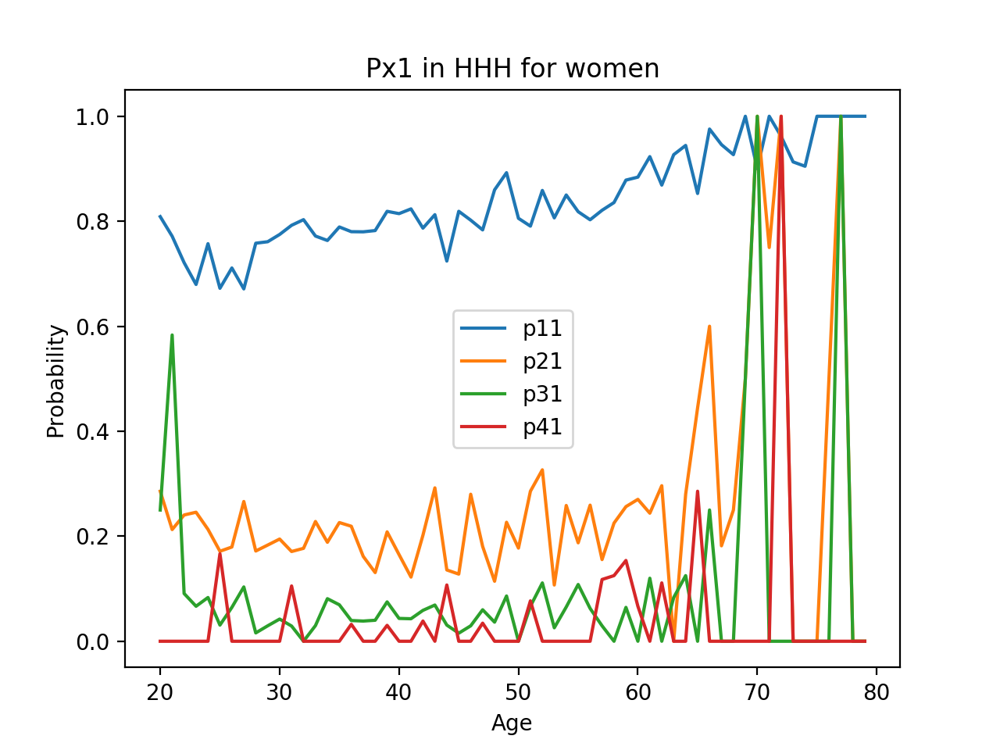

In [75]:
import matplotlib.pyplot as plt
wm11hhh=[]
wm21hhh=[]
wm31hhh=[]
wm41hhh=[]
for i in wifemarkovhhh:
    wm11hhh.append(i[0][0])
    wm21hhh.append(i[1][0])
    wm31hhh.append(i[2][0])
    wm41hhh.append(i[3][0])
age=np.arange(20,20+len(wm11hhh))
%matplotlib notebook
plt.plot(age,wm11hhh,label='p11')
plt.plot(age,wm21hhh,label='p21')
plt.plot(age,wm31hhh,label='p31')
plt.plot(age,wm41hhh,label='p41')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px1 in HHH for women')
plt.legend()

<IPython.core.display.Javascript object>


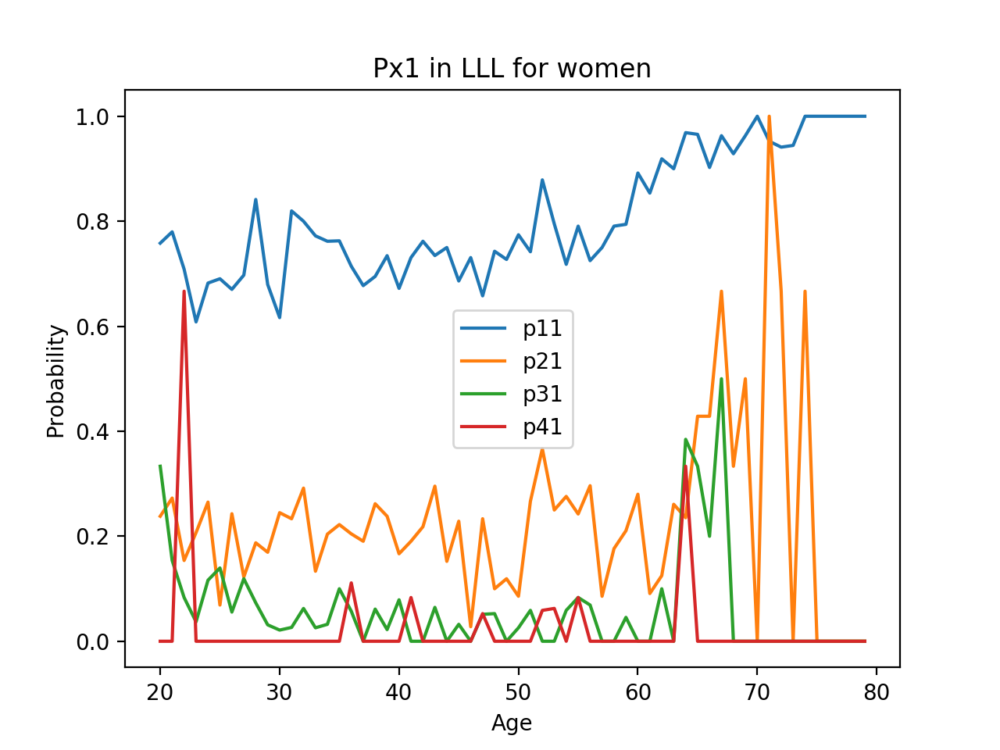

In [76]:
import matplotlib.pyplot as plt
wm11lll=[]
wm21lll=[]
wm31lll=[]
wm41lll=[]
for i in wifemarkovlll:
    wm11lll.append(i[0][0])
    wm21lll.append(i[1][0])
    wm31lll.append(i[2][0])
    wm41lll.append(i[3][0])
age=np.arange(20,20+len(wm11lll))
%matplotlib notebook
plt.plot(age,wm11lll,label='p11')
plt.plot(age,wm21lll,label='p21')
plt.plot(age,wm31lll,label='p31')
plt.plot(age,wm41lll,label='p41')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px1 in LLL for women')
plt.legend()

<IPython.core.display.Javascript object>


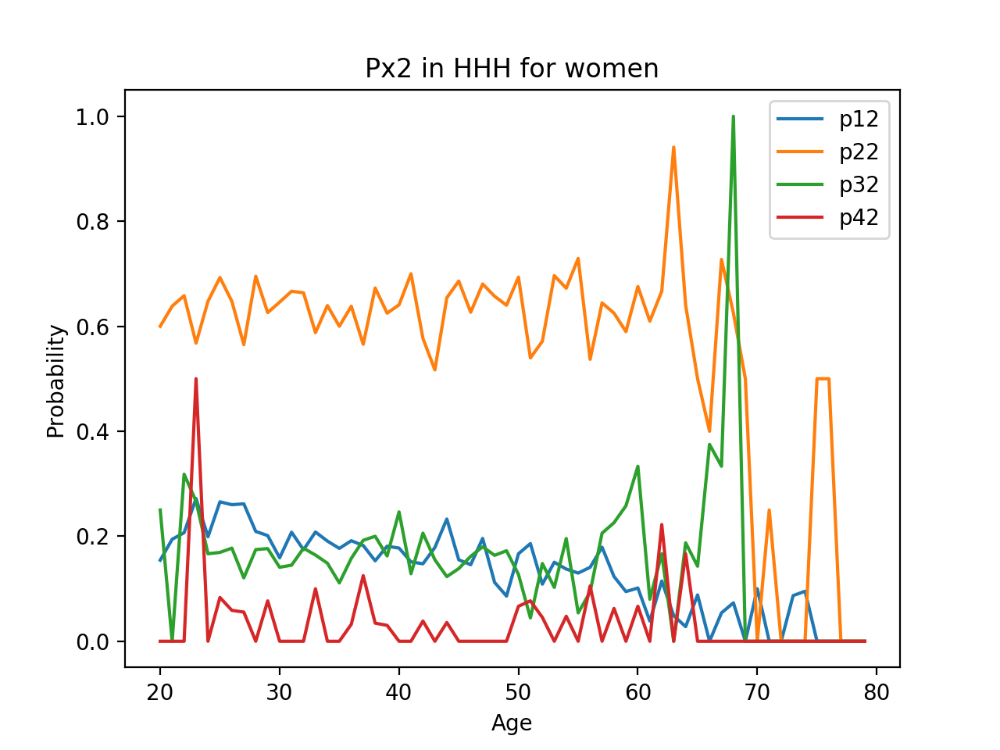

In [77]:
import matplotlib.pyplot as plt
wm12hhh=[]
wm22hhh=[]
wm32hhh=[]
wm42hhh=[]
for i in wifemarkovhhh:
    wm12hhh.append(i[0][1])
    wm22hhh.append(i[1][1])
    wm32hhh.append(i[2][1])
    wm42hhh.append(i[3][1])
age=np.arange(20,20+len(wm11hhh))
wifemarkov1.shape
%matplotlib notebook
plt.plot(age,wm12hhh,label='p12')
plt.plot(age,wm22hhh,label='p22')
plt.plot(age,wm32hhh,label='p32')
plt.plot(age,wm42hhh,label='p42')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px2 in HHH for women')
plt.legend()

<IPython.core.display.Javascript object>


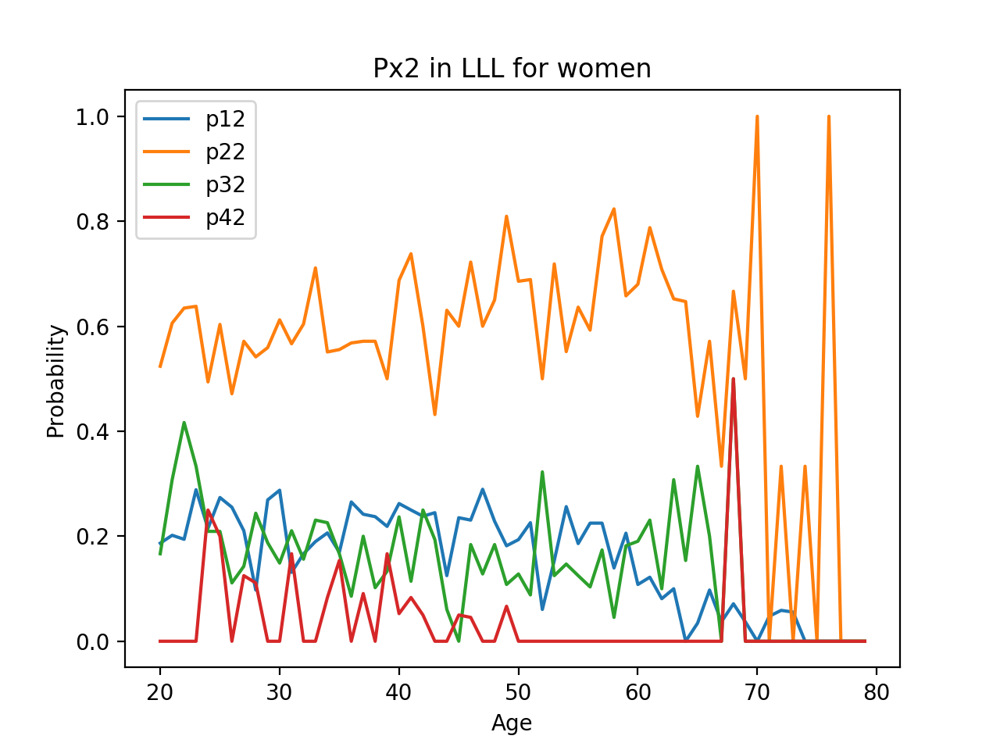

In [78]:
import matplotlib.pyplot as plt
wm12lll=[]
wm22lll=[]
wm32lll=[]
wm42lll=[]
for i in wifemarkovlll:
    wm12lll.append(i[0][1])
    wm22lll.append(i[1][1])
    wm32lll.append(i[2][1])
    wm42lll.append(i[3][1])
age=np.arange(20,20+len(wm11lll))
%matplotlib notebook
plt.plot(age,wm12lll,label='p12')
plt.plot(age,wm22lll,label='p22')
plt.plot(age,wm32lll,label='p32')
plt.plot(age,wm42lll,label='p42')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px2 in LLL for women')
plt.legend()

<IPython.core.display.Javascript object>


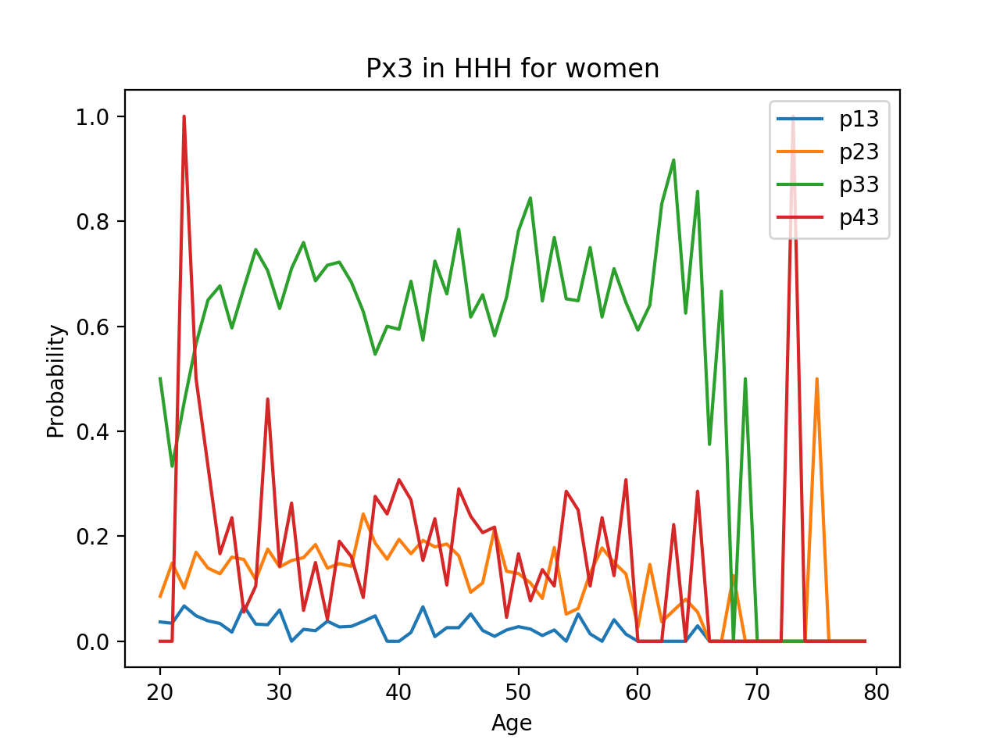

In [79]:
import matplotlib.pyplot as plt
wm13hhh=[]
wm23hhh=[]
wm33hhh=[]
wm43hhh=[]
for i in wifemarkovhhh:
    wm13hhh.append(i[0][2])
    wm23hhh.append(i[1][2])
    wm33hhh.append(i[2][2])
    wm43hhh.append(i[3][2])
age=np.arange(20,20+len(wm11hhh))
%matplotlib notebook
plt.plot(age,wm13hhh,label='p13')
plt.plot(age,wm23hhh,label='p23')
plt.plot(age,wm33hhh,label='p33')
plt.plot(age,wm43hhh,label='p43')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px3 in HHH for women')
plt.legend()

<IPython.core.display.Javascript object>


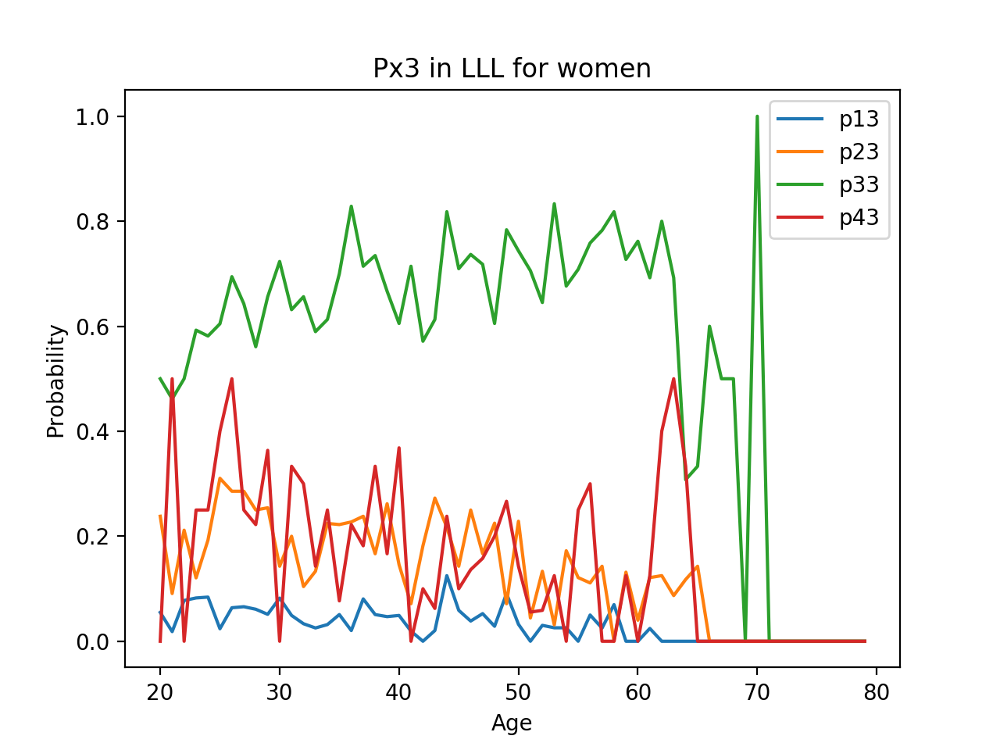

In [80]:
import matplotlib.pyplot as plt
wm13lll=[]
wm23lll=[]
wm33lll=[]
wm43lll=[]
for i in wifemarkovlll:
    wm13lll.append(i[0][2])
    wm23lll.append(i[1][2])
    wm33lll.append(i[2][2])
    wm43lll.append(i[3][2])
age=np.arange(20,20+len(wm11lll))
%matplotlib notebook
plt.plot(age,wm13lll,label='p13')
plt.plot(age,wm23lll,label='p23')
plt.plot(age,wm33lll,label='p33')
plt.plot(age,wm43lll,label='p43')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px3 in LLL for women')
plt.legend()

<IPython.core.display.Javascript object>


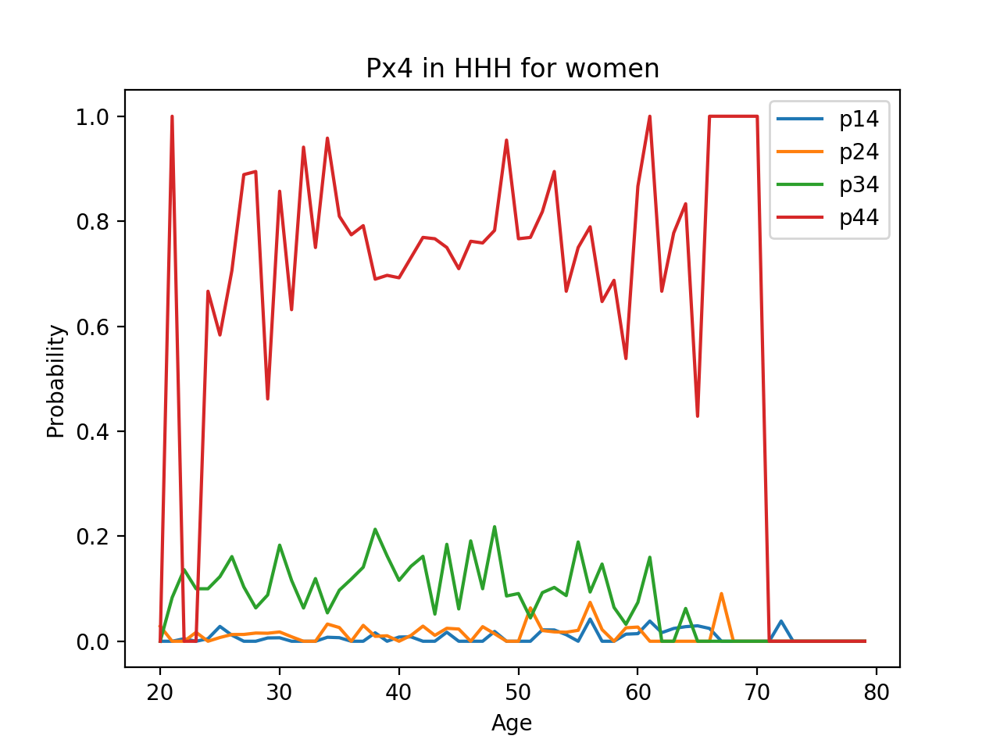

In [81]:
import matplotlib.pyplot as plt
wm14hhh=[]
wm24hhh=[] 
wm34hhh=[]
wm44hhh=[]
for i in wifemarkovhhh:
    wm14hhh.append(i[0][3])
    wm24hhh.append(i[1][3])
    wm34hhh.append(i[2][3])
    wm44hhh.append(i[3][3])
age=np.arange(20,20+len(wm11hhh))
%matplotlib notebook
plt.plot(age,wm14hhh,label='p14')
plt.plot(age,wm24hhh,label='p24')
plt.plot(age,wm34hhh,label='p34')
plt.plot(age,wm44hhh,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px4 in HHH for women')
plt.legend()

<IPython.core.display.Javascript object>


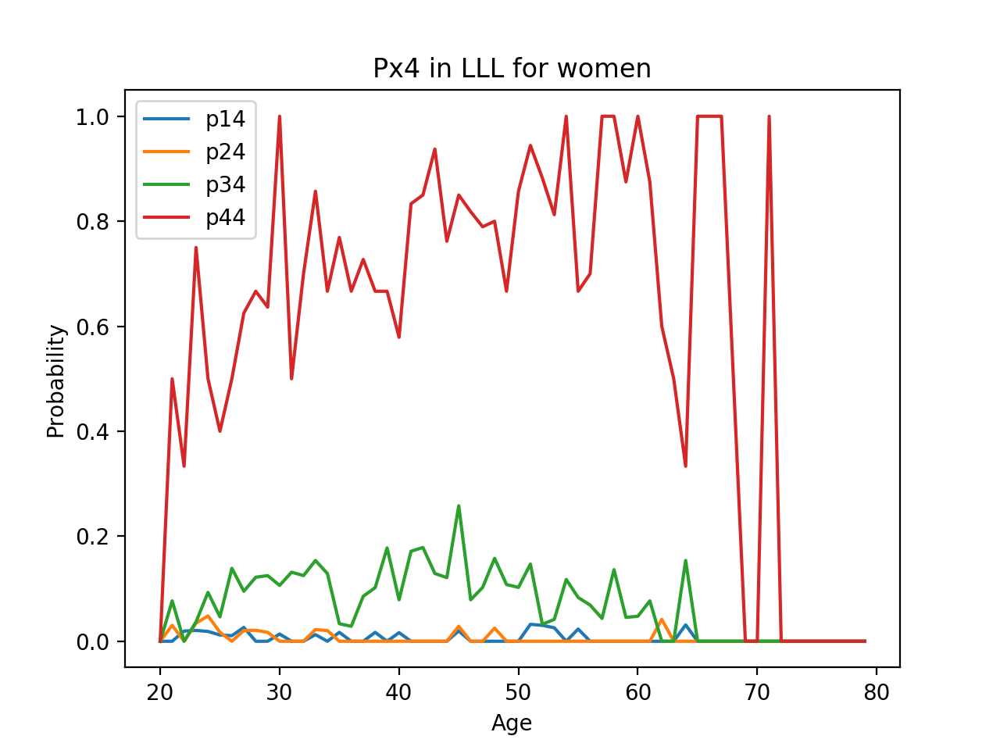

In [82]:
import matplotlib.pyplot as plt
wm14lll=[]
wm24lll=[]
wm34lll=[]
wm44lll=[]
for i in wifemarkovlll:
    wm14lll.append(i[0][3])
    wm24lll.append(i[1][3])
    wm34lll.append(i[2][3])
    wm44lll.append(i[3][3])
age=np.arange(20,20+len(wm11hhh))
%matplotlib notebook
plt.plot(age,wm14lll,label='p14')
plt.plot(age,wm24lll,label='p24')
plt.plot(age,wm34lll,label='p34')
plt.plot(age,wm44lll,label='p44')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('Px4 in LLL for women')
plt.legend()

<IPython.core.display.Javascript object>


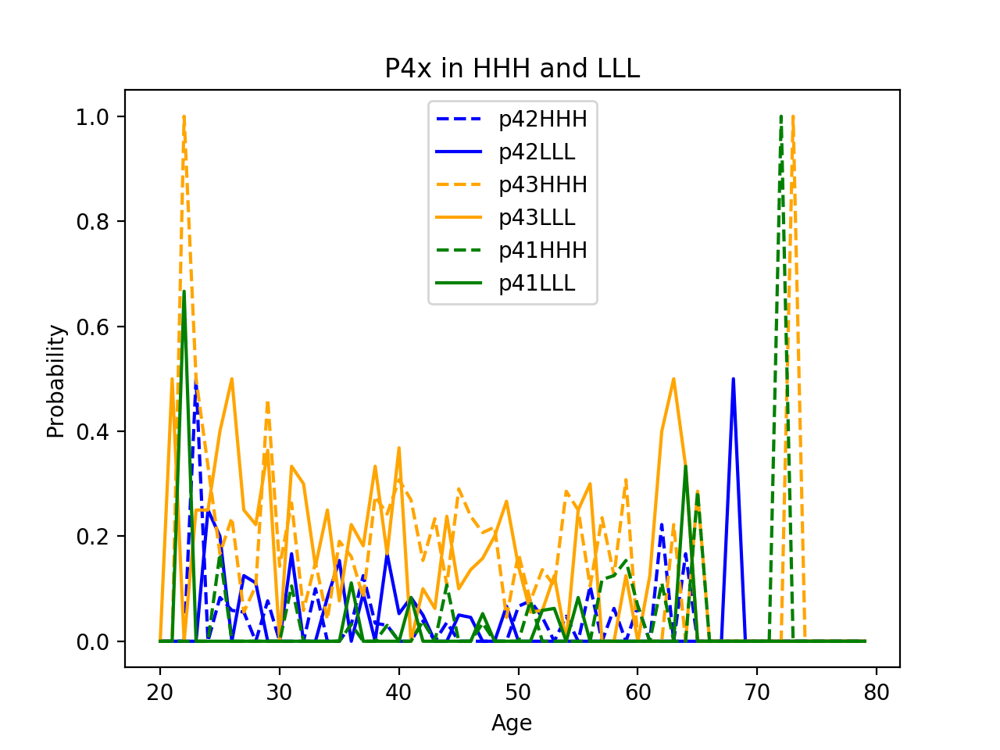

In [83]:
%matplotlib notebook
plt.plot(age,wm42hhh,label='p42HHH',color='blue',linestyle='dashed')
plt.plot(age,wm42lll,label='p42LLL',color='blue')
plt.plot(age,wm43hhh,label='p43HHH',color='orange',linestyle='dashed')
plt.plot(age,wm43lll,label='p43LLL',color='orange')
plt.plot(age,wm41hhh,label='p41HHH',color='green',linestyle='dashed')
plt.plot(age,wm41lll,label='p41LLL',color='green')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('P4x in HHH and LLL')
plt.legend()

<IPython.core.display.Javascript object>


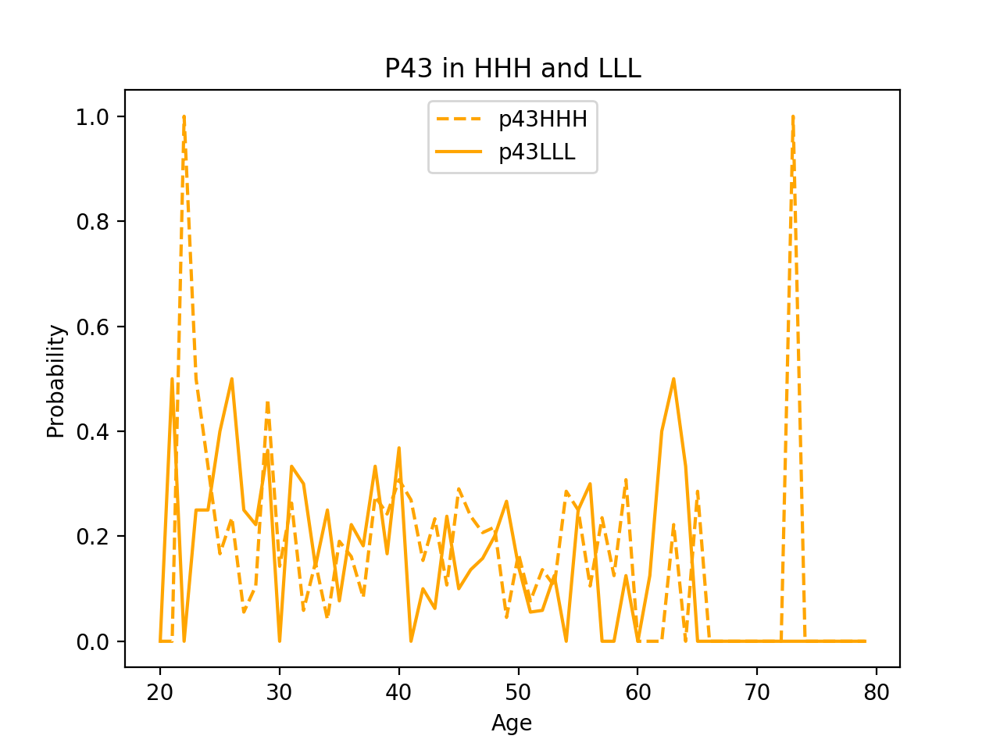

In [84]:
%matplotlib notebook
plt.plot(age,wm43hhh,label='p43HHH',color='orange',linestyle='dashed')
plt.plot(age,wm43lll,label='p43LLL',color='orange')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('P43 in HHH and LLL')
plt.legend()

<IPython.core.display.Javascript object>


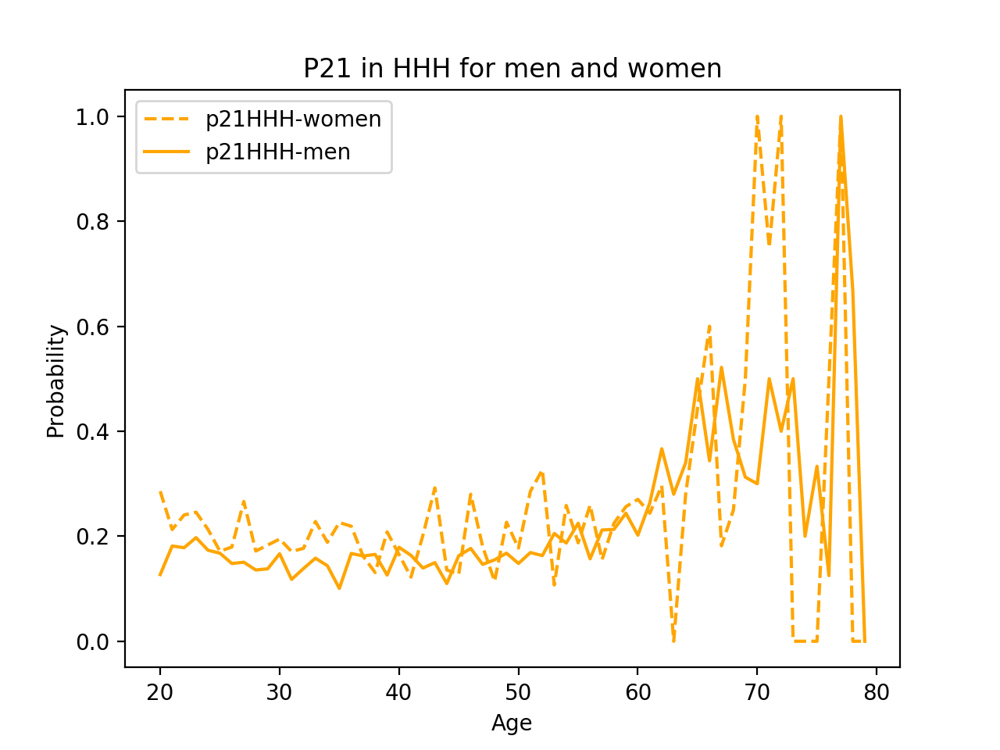

In [86]:
%matplotlib notebook
plt.plot(age,wm21hhh,label='p21HHH-women',color='orange',linestyle='dashed')
plt.plot(age,hm21hhh,label='p21HHH-men',color='orange')
plt.xlabel('Age')
plt.ylabel('Probability')
plt.title('P21 in HHH for men and women')
plt.legend()

In [87]:
print('The summation of p43_hhh w.r.t age:',sum(headmarkovhhh[:,3,2]))
print('The summation of p43_hhl w.r.t age:',sum(headmarkovhhl[:,3,2]))
print('The summation of p43_hlh w.r.t age:',sum(headmarkovhlh[:,3,2]))
print('The summation of p43_lhh w.r.t age:',sum(headmarkovlhh[:,3,2]))
print('The summation of p43_llh w.r.t age:',sum(headmarkovllh[:,3,2]))
print('The summation of p43_lhl w.r.t age:',sum(headmarkovlhl[:,3,2]))
print('The summation of p43_hll w.r.t age:',sum(headmarkovhll[:,3,2]))
print('The summation of p43_lll w.r.t age:',sum(headmarkovlll[:,3,2]))

The summation of p43_hhh w.r.t age: 10.571670168699185
The summation of p43_hhl w.r.t age: 10.646237081262273
The summation of p43_hlh w.r.t age: 6.842590547481687
The summation of p43_lhh w.r.t age: 9.169960280366467
The summation of p43_llh w.r.t age: 9.689922607240419
The summation of p43_lhl w.r.t age: 8.863440669817557
The summation of p43_hll w.r.t age: 8.312378640149252
The summation of p43_lll w.r.t age: 10.285613197462387


In [88]:
sum_p43=[2,3,0,1,2,1,1,2]
standard=np.array([3,2,2,2,1,1,1,0])
sum(abs(standard-sum_p43))

8

hhl>hhh>lll>llh>lhh>lhl>hll>hlh

23012111


In [89]:
print('The summation of p42_hhh w.r.t age:',sum(headmarkovhhh[:,3,1]))
print('The summation of p42_hhl w.r.t age:',sum(headmarkovhhl[:,3,1]))
print('The summation of p42_hlh w.r.t age:',sum(headmarkovhlh[:,3,1]))
print('The summation of p42_lhh w.r.t age:',sum(headmarkovlhh[:,3,1]))
print('The summation of p42_llh w.r.t age:',sum(headmarkovllh[:,3,1]))
print('The summation of p42_lhl w.r.t age:',sum(headmarkovlhl[:,3,1]))
print('The summation of p42_hll w.r.t age:',sum(headmarkovhll[:,3,1]))
print('The summation of p42_lll w.r.t age:',sum(headmarkovlll[:,3,1]))

The summation of p42_hhh w.r.t age: 2.6381585189352275
The summation of p42_hhl w.r.t age: 2.4382857559214397
The summation of p42_hlh w.r.t age: 2.498089261072399
The summation of p42_lhh w.r.t age: 2.1781809203763967
The summation of p42_llh w.r.t age: 3.0883202135463623
The summation of p42_lhl w.r.t age: 2.040939207902575
The summation of p42_hll w.r.t age: 2.1673741521805887
The summation of p42_lll w.r.t age: 1.9385075197078405


llh>hhh>hlh>hhl>lhh>hll>lhl>lll

13222110

In [90]:
sum_p42=np.array([1,3,2,2,2,1,1,0])
sum(abs(standard-sum_p42))

4

In [91]:
print('The summation of p41_hhh w.r.t age:',sum(headmarkovhhh[:,3,0]))
print('The summation of p41_hhl w.r.t age:',sum(headmarkovhhl[:,3,0]))
print('The summation of p41_hlh w.r.t age:',sum(headmarkovhlh[:,3,0]))
print('The summation of p41_lhh w.r.t age:',sum(headmarkovlhh[:,3,0]))
print('The summation of p41_llh w.r.t age:',sum(headmarkovllh[:,3,0]))
print('The summation of p41_lhl w.r.t age:',sum(headmarkovlhl[:,3,0]))
print('The summation of p41_hll w.r.t age:',sum(headmarkovhll[:,3,0]))
print('The summation of p41_lll w.r.t age:',sum(headmarkovlll[:,3,0]))

The summation of p41_hhh w.r.t age: 2.9239070627713284
The summation of p41_hhl w.r.t age: 2.5845557419410383
The summation of p41_hlh w.r.t age: 1.06694243737334
The summation of p41_lhh w.r.t age: 2.146156762788225
The summation of p41_llh w.r.t age: 3.7948394031302364
The summation of p41_lhl w.r.t age: 1.5483632221960724
The summation of p41_hll w.r.t age: 1.343875549140696
The summation of p41_lll w.r.t age: 1.9354165403634114


In [92]:
sum_p41=[1,3,2,2,0,1,1,2]
standard=np.array([3,2,2,2,1,1,1,0])
sum(abs(standard-sum_p41))

6

llh>hhh>hhl>lhh>lll>lhl>hll>hlh
13220112

In [93]:
print('The summation of p31_hhh w.r.t age:',sum(headmarkovhhh[:,2,0]))
print('The summation of p31_hhl w.r.t age:',sum(headmarkovhhl[:,2,0]))
print('The summation of p31_hlh w.r.t age:',sum(headmarkovhlh[:,2,0]))
print('The summation of p31_lhh w.r.t age:',sum(headmarkovlhh[:,2,0]))
print('The summation of p31_llh w.r.t age:',sum(headmarkovllh[:,2,0]))
print('The summation of p31_lhl w.r.t age:',sum(headmarkovlhl[:,2,0]))
print('The summation of p31_hll w.r.t age:',sum(headmarkovhll[:,2,0]))
print('The summation of p31_lll w.r.t age:',sum(headmarkovlll[:,2,0]))

The summation of p31_hhh w.r.t age: 4.9263515599505325
The summation of p31_hhl w.r.t age: 4.524913411047851
The summation of p31_hlh w.r.t age: 5.217296333595147
The summation of p31_lhh w.r.t age: 4.80840169472689
The summation of p31_llh w.r.t age: 3.738960841878065
The summation of p31_lhl w.r.t age: 3.534573934106112
The summation of p31_hll w.r.t age: 3.4923583792808923
The summation of p31_lll w.r.t age: 4.449738997818321


hlh>hhh>lhh>hhl>lll>llh>lhl>hll 

23220111

In [94]:
sum_p31=[2,3,2,2,0,1,1,1]
standard=np.array([3,2,2,2,1,1,1,0])
sum(abs(standard-sum_p31))

4

In [95]:
print('The summation of p32_hhh w.r.t age:',sum(headmarkovhhh[:,2,1]))
print('The summation of p32_hhl w.r.t age:',sum(headmarkovhhl[:,2,1]))
print('The summation of p32_hlh w.r.t age:',sum(headmarkovhlh[:,2,1]))
print('The summation of p32_lhh w.r.t age:',sum(headmarkovlhh[:,2,1]))
print('The summation of p32_llh w.r.t age:',sum(headmarkovllh[:,2,1]))
print('The summation of p32_lhl w.r.t age:',sum(headmarkovlhl[:,2,1]))
print('The summation of p32_hll w.r.t age:',sum(headmarkovhll[:,2,1]))
print('The summation of p32_lll w.r.t age:',sum(headmarkovlll[:,2,1]))

The summation of p32_hhh w.r.t age: 10.445794551047149
The summation of p32_hhl w.r.t age: 11.637927160842283
The summation of p32_hlh w.r.t age: 6.323335800297748
The summation of p32_lhh w.r.t age: 8.936409625304705
The summation of p32_llh w.r.t age: 7.696153219346896
The summation of p32_lhl w.r.t age: 6.891439459716902
The summation of p32_hll w.r.t age: 9.192005881105182
The summation of p32_lll w.r.t age: 9.380444770893


hhl>hhh>lll>hll>lhh>llh>lhl>hlh 

23012112

In [96]:
sum_p32=[2,3,0,1,2,1,1,2]
standard=np.array([3,2,2,2,1,1,1,0])
sum(abs(standard-sum_p32))

8

In [97]:
print('The summation of p21_hhh w.r.t age:',sum(headmarkovhhh[:,1,0]))
print('The summation of p21_hhl w.r.t age:',sum(headmarkovhhl[:,1,0]))
print('The summation of p21_hlh w.r.t age:',sum(headmarkovhlh[:,1,0]))
print('The summation of p21_lhh w.r.t age:',sum(headmarkovlhh[:,1,0]))
print('The summation of p21_llh w.r.t age:',sum(headmarkovllh[:,1,0]))
print('The summation of p21_lhl w.r.t age:',sum(headmarkovlhl[:,1,0]))
print('The summation of p21_hll w.r.t age:',sum(headmarkovhll[:,1,0]))
print('The summation of p21_lll w.r.t age:',sum(headmarkovlll[:,1,0]))

The summation of p21_hhh w.r.t age: 14.058259201078984
The summation of p21_hhl w.r.t age: 12.156612334221634
The summation of p21_hlh w.r.t age: 11.354912227429727
The summation of p21_lhh w.r.t age: 11.190392365881722
The summation of p21_llh w.r.t age: 11.253235616857577
The summation of p21_lhl w.r.t age: 10.447964479626949
The summation of p21_hll w.r.t age: 13.6633792923613
The summation of p21_lll w.r.t age: 14.095961079547529


lll>hhh>hll>hhl>hlh>llh>lhh>lhl

03122121

In [98]:
sum_p21=[0,3,1,2,2,1,2,1]
standard=np.array([3,2,2,2,1,1,1,0])
sum(abs(standard-sum_p21))

8

In [99]:
36

36

In [100]:
times=0
N=100000
for i in range(N):
    tot_dis=0
    for j in range(6):
        monte=[3,2,2,2,1,1,1,0]
        random.shuffle(monte)
        monte=np.array(monte)
        tot_dis+=sum(abs(monte-standard))
    if tot_dis<=38:
        times+=1

In [101]:
print('The p value is:', times/N)

The p value is: 0.10429


# for women

In [102]:
print('The summation of p43_hhh w.r.t age:',sum(wifemarkovhhh[:,3,2]))
print('The summation of p43_hhl w.r.t age:',sum(wifemarkovhhl[:,3,2]))
print('The summation of p43_hlh w.r.t age:',sum(wifemarkovhlh[:,3,2]))
print('The summation of p43_lhh w.r.t age:',sum(wifemarkovlhh[:,3,2]))
print('The summation of p43_llh w.r.t age:',sum(wifemarkovllh[:,3,2]))
print('The summation of p43_lhl w.r.t age:',sum(wifemarkovlhl[:,3,2]))
print('The summation of p43_hll w.r.t age:',sum(wifemarkovhll[:,3,2]))
print('The summation of p43_lll w.r.t age:',sum(wifemarkovlll[:,3,2]))

The summation of p43_hhh w.r.t age: 9.839065240333502
The summation of p43_hhl w.r.t age: 9.556351256679246
The summation of p43_hlh w.r.t age: 6.583333333333334
The summation of p43_lhh w.r.t age: 7.494047619047619
The summation of p43_llh w.r.t age: 11.533333333333333
The summation of p43_lhl w.r.t age: 8.908333333333333
The summation of p43_hll w.r.t age: 8.983333333333333
The summation of p43_lll w.r.t age: 8.788523434769564


llh>hhh>hhl>hll>lhl>lll>lhh>hlh


In [103]:
sum_wp43=[1,3,2,1,1,0,2,2]
sum(abs(standard-sum_wp43))

8

In [104]:
print('The summation of p42_hhh w.r.t age:',sum(wifemarkovhhh[:,3,1]))
print('The summation of p42_hhl w.r.t age:',sum(wifemarkovhhl[:,3,1]))
print('The summation of p42_hlh w.r.t age:',sum(wifemarkovhlh[:,3,1]))
print('The summation of p42_lhh w.r.t age:',sum(wifemarkovlhh[:,3,1]))
print('The summation of p42_llh w.r.t age:',sum(wifemarkovllh[:,3,1]))
print('The summation of p42_lhl w.r.t age:',sum(wifemarkovlhl[:,3,1]))
print('The summation of p42_hll w.r.t age:',sum(wifemarkovhll[:,3,1]))
print('The summation of p42_lll w.r.t age:',sum(wifemarkovlll[:,3,1]))

The summation of p42_hhh w.r.t age: 2.0308372229530325
The summation of p42_hhl w.r.t age: 2.7174021444986582
The summation of p42_hlh w.r.t age: 2.4333333333333336
The summation of p42_lhh w.r.t age: 2.477380952380952
The summation of p42_llh w.r.t age: 1.0
The summation of p42_lhl w.r.t age: 2.783333333333333
The summation of p42_hll w.r.t age: 1.5
The summation of p42_lll w.r.t age: 2.1956191469349364


lhl>hhl>lhh>hlh>lll>hhh>hll>llh

In [105]:
sum_wp42=[1,2,2,2,0,3,1,1]
sum(abs(standard-sum_wp42))

6

In [106]:
print('The summation of p41_hhh w.r.t age:',sum(wifemarkovhhh[:,3,0]))
print('The summation of p41_hhl w.r.t age:',sum(wifemarkovhhl[:,3,0]))
print('The summation of p41_hlh w.r.t age:',sum(wifemarkovhlh[:,3,0]))
print('The summation of p41_lhh w.r.t age:',sum(wifemarkovlhh[:,3,0]))
print('The summation of p41_llh w.r.t age:',sum(wifemarkovllh[:,3,0]))
print('The summation of p41_lhl w.r.t age:',sum(wifemarkovlhl[:,3,0]))
print('The summation of p41_hll w.r.t age:',sum(wifemarkovhll[:,3,0]))
print('The summation of p41_lll w.r.t age:',sum(wifemarkovlll[:,3,0]))

The summation of p41_hhh w.r.t age: 2.451486426690472
The summation of p41_hhl w.r.t age: 1.9616650053720992
The summation of p41_hlh w.r.t age: 1.6666666666666665
The summation of p41_lhh w.r.t age: 3.0944444444444446
The summation of p41_llh w.r.t age: 2.333333333333333
The summation of p41_lhl w.r.t age: 1.4916666666666665
The summation of p41_hll w.r.t age: 0.3333333333333333
The summation of p41_lll w.r.t age: 1.4517328861369108


lhh>hhh>llh>hhl>hlh>lhl>lll>hll

In [107]:
sum_wp41=[2,3,1,2,2,1,0,1]
sum(abs(standard-sum_wp41))

6

In [108]:
print('The summation of p31_hhh w.r.t age:',sum(wifemarkovhhh[:,2,0]))
print('The summation of p31_hhl w.r.t age:',sum(wifemarkovhhl[:,2,0]))
print('The summation of p31_hlh w.r.t age:',sum(wifemarkovhlh[:,2,0]))
print('The summation of p31_lhh w.r.t age:',sum(wifemarkovlhh[:,2,0]))
print('The summation of p31_llh w.r.t age:',sum(wifemarkovllh[:,2,0]))
print('The summation of p31_lhl w.r.t age:',sum(wifemarkovlhl[:,2,0]))
print('The summation of p31_hll w.r.t age:',sum(wifemarkovhll[:,2,0]))
print('The summation of p31_lll w.r.t age:',sum(wifemarkovlll[:,2,0]))

The summation of p31_hhh w.r.t age: 5.846577487381939
The summation of p31_hhl w.r.t age: 4.77448027766134
The summation of p31_hlh w.r.t age: 3.236408036408036
The summation of p31_lhh w.r.t age: 3.892718594614879
The summation of p31_llh w.r.t age: 3.4516233766233766
The summation of p31_lhl w.r.t age: 3.9577444614209316
The summation of p31_hll w.r.t age: 1.8694444444444445
The summation of p31_lll w.r.t age: 3.6895941525266296


hhh>hhl>lhl>lhh>lll>llh>hlh>hll

In [109]:
sum_wp31=[3,2,1,2,0,1,2,1]
sum(abs(standard-sum_wp31))

4

In [110]:
print('The summation of p32_hhh w.r.t age:',sum(wifemarkovhhh[:,2,1]))
print('The summation of p32_hhl w.r.t age:',sum(wifemarkovhhl[:,2,1]))
print('The summation of p32_hlh w.r.t age:',sum(wifemarkovhlh[:,2,1]))
print('The summation of p32_lhh w.r.t age:',sum(wifemarkovlhh[:,2,1]))
print('The summation of p32_llh w.r.t age:',sum(wifemarkovllh[:,2,1]))
print('The summation of p32_lhl w.r.t age:',sum(wifemarkovlhl[:,2,1]))
print('The summation of p32_hll w.r.t age:',sum(wifemarkovhll[:,2,1]))
print('The summation of p32_lll w.r.t age:',sum(wifemarkovlll[:,2,1]))

The summation of p32_hhh w.r.t age: 9.169243561841167
The summation of p32_hhl w.r.t age: 9.0483881749055
The summation of p32_hlh w.r.t age: 8.649575424575426
The summation of p32_lhh w.r.t age: 8.185082805051845
The summation of p32_llh w.r.t age: 10.863528138528139
The summation of p32_lhl w.r.t age: 6.977778284666829
The summation of p32_hll w.r.t age: 6.972294372294372
The summation of p32_lll w.r.t age: 8.90522529887987


llh>hhh>hhl>lll>hlh>lhh>lhl>hll

In [111]:
sum_wp32=[1,3,2,0,2,2,1,1]
sum(abs(standard-sum_wp32))

8

In [112]:
print('The summation of p21_hhh w.r.t age:',sum(wifemarkovhhh[:,1,0]))
print('The summation of p21_hhl w.r.t age:',sum(wifemarkovhhl[:,1,0]))
print('The summation of p21_hlh w.r.t age:',sum(wifemarkovhlh[:,1,0]))
print('The summation of p21_lhh w.r.t age:',sum(wifemarkovlhh[:,1,0]))
print('The summation of p21_llh w.r.t age:',sum(wifemarkovllh[:,1,0]))
print('The summation of p21_lhl w.r.t age:',sum(wifemarkovlhl[:,1,0]))
print('The summation of p21_hll w.r.t age:',sum(wifemarkovhll[:,1,0]))
print('The summation of p21_lll w.r.t age:',sum(wifemarkovlll[:,1,0]))

The summation of p21_hhh w.r.t age: 15.477666766101411
The summation of p21_hhl w.r.t age: 12.95948371482377
The summation of p21_hlh w.r.t age: 11.139983534037244
The summation of p21_lhh w.r.t age: 11.583118642855233
The summation of p21_llh w.r.t age: 8.888908803614687
The summation of p21_lhl w.r.t age: 11.631465134303337
The summation of p21_hll w.r.t age: 12.306698693463398
The summation of p21_lll w.r.t age: 13.823019088159995


hhh>lll>hhl>hll>lhl>lhh>hlh>llh

In [113]:
sum_wp21=[3,0,2,1,1,2,2,1]
sum(abs(standard-sum_wp21))

6

In [114]:
times=0
N=100000
for i in range(N):
    tot_dis=0
    for j in range(6):
        monte=[3,2,2,2,1,1,1,0]
        random.shuffle(monte)
        monte=np.array(monte)
        tot_dis+=sum(abs(monte-standard))
    if tot_dis<=42:
        times+=1

In [115]:
times/N

0.3254

In [117]:
times=0
N=100000
for i in range(N):
    tot_dis=0
    for j in range(12):
        monte=[3,2,2,2,1,1,1,0]
        random.shuffle(monte)
        monte=np.array(monte)
        tot_dis+=sum(abs(monte-standard))
    if tot_dis<=70:
        times+=1

In [118]:
print('The p-value corresponding to the null hypothesis that "the probability of downward mobility is the same in HHH and LLL" is', times/N) 

The p-value corresponding to the null hypothesis that "the probability of downward mobility is the same in HHH and LLL" is 0.0031


In [120]:
tran=[]
gender=[]
age=[]
disab=[]
job=[]
race=[]
ethnic=[]
spain=[]
numchild=[]
inequality=[]
dropout=[]
crime=[]
for i in range(len(income)):
    for j in range(4,len(headage_ind)-1):
        type=16
        inc=income[headinc_ind[j]][i]
        inc2=income[headinc_ind[j+1]][i]
        loc=income[state_ind[j]][i]
        if (loc<1) or (loc>51):
            continue
        if (inc!=0) & (inc2!=0):
            age.append(income[headage_ind[j]][i])
            disab.append(income[headdis_ind[j-3]][i])
            race.append(income[headrace_ind[j]][i])
            gender.append(income[headsex_ind[j]][i])
            if loc in hhh:
                inequality.append(1) 
                crime.append(1)
                dropout.append(1)
            elif loc in hhl:
                inequality.append(1) 
                crime.append(1)
                dropout.append(0)
            elif loc in hlh:
                inequality.append(1) 
                crime.append(0)
                dropout.append(1)
            elif loc in hll:
                inequality.append(1) 
                crime.append(0)
                dropout.append(0)
            elif loc in lhh:
                inequality.append(0) 
                crime.append(1)
                dropout.append(1)
            elif loc in llh:
                inequality.append(0) 
                crime.append(0)
                dropout.append(1)
            elif loc in lhl:
                inequality.append(0) 
                crime.append(1)
                dropout.append(0)
            elif loc in lll:
                inequality.append(0) 
                crime.append(0)
                dropout.append(0)
            if (inc<headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=11
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=12
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=13
            elif (inc<headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=14
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2<headinc_quan[j+1][2]):
                type=21
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=22
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=23
            elif (inc<headinc_quan[j][1]) & (inc>=headinc_quan[j][2]) & (inc2>=headinc_quan[j+1][0]):
                type=24
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2<headinc_quan[j+1][2]):
                type=31
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=32
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=33
            elif (inc<headinc_quan[j][0]) & (inc>=headinc_quan[j][1]) & (inc2>=headinc_quan[j+1][0]):
                type=34
            elif (inc>=headinc_quan[j][0]) & (inc2<headinc_quan[j+1][2]):
                type=41
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][2]) & (inc2<headinc_quan[j+1][1]):
                type=42
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][1]) & (inc2<headinc_quan[j+1][0]):
                type=43
            elif (inc>=headinc_quan[j][0]) & (inc2>=headinc_quan[j+1][0]):
                type=44
            tran.append(type)

In [121]:
atran=np.array(tran)
agender=np.array(gender)
aage=np.array(age)
adisab=np.array(disab)
arace=np.array(race)
ainequality=np.array(inequality)
acrime=np.array(crime)
adropout=np.array(dropout)

In [122]:
final=pd.DataFrame({'income transition':atran,
                       'gender':agender,
                       'age':aage,
                       'disability':adisab,
                       'race':arace,
                       'inequality':ainequality,
                       'crime':acrime,
                       'dropout rate':adropout
                      })

In [123]:
final['p11']=0
final['p11'][final['income transition']==11]=1
final['p12']=0
final['p12'][final['income transition']==12]=1
final['p13']=0
final['p13'][final['income transition']==13]=1
final['p14']=0
final['p14'][final['income transition']==14]=1
final['p21']=0
final['p21'][final['income transition']==21]=1
final['p22']=0
final['p22'][final['income transition']==22]=1
final['p23']=0
final['p23'][final['income transition']==23]=1
final['p24']=0
final['p24'][final['income transition']==24]=1
final['p31']=0
final['p31'][final['income transition']==31]=1
final['p32']=0
final['p32'][final['income transition']==32]=1
final['p33']=0
final['p33'][final['income transition']==33]=1
final['p34']=0
final['p34'][final['income transition']==34]=1
final['p41']=0
final['p41'][final['income transition']==41]=1
final['p42']=0
final['p42'][final['income transition']==42]=1
final['p43']=0
final['p43'][final['income transition']==43]=1
final['p44']=0
final['p44'][final['income transition']==44]=1

/Users/fulinguo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/fulinguo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/Users/fulinguo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/Users/fulinguo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py

In [124]:
final['downward']=0
down=(final['income transition']==21) | (final['income transition']==31) |(final['income transition']==41) |(final['income transition']==32) |(final['income transition']==42) |(final['income transition']==43)
final['downward'][down]=1

/Users/fulinguo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [125]:
final['const']=1

In [126]:
final

,income transition,gender,age,disability,race,inequality,crime,dropout rate,p11,p12,...,p31,p32,p33,p34,p41,p42,p43,p44,downward,const
0,22,2.0,50.0,0.0,1.0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
1,22,2.0,51.0,0.0,1.0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
2,22,2.0,52.0,0.0,1.0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
3,22,2.0,53.0,0.0,1.0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
4,22,2.0,55.0,0.0,1.0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
5,23,1.0,25.0,0.0,1.0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,1
6,33,1.0,25.0,0.0,1.0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
7,33,1.0,27.0,0.0,1.0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
8,33,1.0,28.0,0.0,1.0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1
9,33,1.0,30.0,0.0,1.0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,1


In [129]:
X=final[['const', 'gender','age','disability','inequality','crime','dropout rate']].values
y=final['downward'].values
LogitModel=sm.Logit(y,X)
LogitReg_sm=LogitModel.fit()
LogitReg_sm.summary()

Optimization terminated successfully.
         Current function value: 0.418530
         Iterations 6


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:               173318
Model:                          Logit   Df Residuals:                   173311
Method:                           MLE   Df Model:                            6
Date:                Tue, 25 Jun 2019   Pseudo R-squ.:                0.002304
Time:                        21:26:06   Log-Likelihood:                -72539.
converged:                       True   LL-Null:                       -72706.
                                        LLR p-value:                 2.500e-69
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5455      0.030    -51.996      0.000      -1.604      -1.487
x1            -0.2843      0.017    -16.452      0.000      -0.318      -0.250
x2             0.0029      0.000      6.403      0.000       0.002       0.004
x3             0.0151      0.005      2.817      0.005       0.005       0.026
x4            -0.0087      0.017     -0.502      0.616      -0.042       0.025
x5             0.0132      0.018      0.734      0.463      -0.022       0.048
x6             0.0374      0.014      2.652      0.008       0.010       0.065
==============================================================================
"""

In [130]:
X=final[['const', 'gender','age','disability','inequality','crime','dropout rate']].values
y=final['p31'].values
LogitModel=sm.Logit(y,X)
LogitReg_sm=LogitModel.fit()
LogitReg_sm.summary()

Optimization terminated successfully.
         Current function value: 0.071472
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:               173318
Model:                          Logit   Df Residuals:                   173311
Method:                           MLE   Df Model:                            6
Date:                Tue, 25 Jun 2019   Pseudo R-squ.:                0.001880
Time:                        21:26:26   Log-Likelihood:                -12387.
converged:                       True   LL-Null:                       -12411.
                                        LLR p-value:                 2.187e-08
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.1906      0.080    -52.546      0.000      -4.347      -4.034
x1            -0.2297      0.053     -4.307      0.000      -0.334      -0.125
x2             0.0035      0.001      4.795      0.000       0.002       0.005
x3             0.0428      0.015      2.823      0.005       0.013       0.073
x4            -0.0961      0.053     -1.830      0.067      -0.199       0.007
x5             0.1140      0.056      2.047      0.041       0.005       0.223
x6             0.0111      0.043      0.256      0.798      -0.074       0.096
==============================================================================
"""

In [131]:
X=final[['const', 'gender','age','disability','inequality','crime','dropout rate']].values
y=final['p41'].values
LogitModel=sm.Logit(y,X)
LogitReg_sm=LogitModel.fit()
LogitReg_sm.summary()

Optimization terminated successfully.
         Current function value: 0.030148
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:               173318
Model:                          Logit   Df Residuals:                   173311
Method:                           MLE   Df Model:                            6
Date:                Tue, 25 Jun 2019   Pseudo R-squ.:                 0.01584
Time:                        21:26:35   Log-Likelihood:                -5225.3
converged:                       True   LL-Null:                       -5309.4
                                        LLR p-value:                 1.059e-33
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -4.3769      0.147    -29.739      0.000      -4.665      -4.088
x1            -1.0370      0.119     -8.721      0.000      -1.270      -0.804
x2             0.0067      0.001      8.376      0.000       0.005       0.008
x3             0.0744      0.023      3.169      0.002       0.028       0.120
x4            -0.0949      0.087     -1.090      0.276      -0.265       0.076
x5            -0.0428      0.091     -0.472      0.637      -0.221       0.135
x6             0.0799      0.073      1.101      0.271      -0.062       0.222
==============================================================================
"""

In [132]:
X=final[['const', 'gender','age','disability','inequality','crime','dropout rate']].values
y=final['p32'].values
LogitModel=sm.Logit(y,X)
LogitReg_sm=LogitModel.fit()
LogitReg_sm.summary()

Optimization terminated successfully.
         Current function value: 0.173130
         Iterations 7


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:               173318
Model:                          Logit   Df Residuals:                   173311
Method:                           MLE   Df Model:                            6
Date:                Tue, 25 Jun 2019   Pseudo R-squ.:                0.002147
Time:                        21:26:44   Log-Likelihood:                -30006.
converged:                       True   LL-Null:                       -30071.
                                        LLR p-value:                 1.965e-25
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.6270      0.057    -46.139      0.000      -2.739      -2.515
x1            -0.3100      0.032     -9.837      0.000      -0.372      -0.248
x2            -0.0043      0.001     -4.370      0.000      -0.006      -0.002
x3            -0.0054      0.010     -0.539      0.590      -0.025       0.014
x4             0.0019      0.031      0.061      0.951      -0.058       0.062
x5             0.0220      0.032      0.688      0.492      -0.041       0.085
x6             0.0400      0.025      1.599      0.110      -0.009       0.089
==============================================================================
"""

In [133]:
X=final[['const', 'gender','age','disability','inequality','crime','dropout rate']].values
y=final['p42'].values
LogitModel=sm.Logit(y,X)
LogitReg_sm=LogitModel.fit()
LogitReg_sm.summary()

Optimization terminated successfully.
         Current function value: 0.041347
         Iterations 10


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:               173318
Model:                          Logit   Df Residuals:                   173311
Method:                           MLE   Df Model:                            6
Date:                Tue, 25 Jun 2019   Pseudo R-squ.:                 0.01391
Time:                        21:26:53   Log-Likelihood:                -7166.2
converged:                       True   LL-Null:                       -7267.3
                                        LLR p-value:                 6.326e-41
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.7519      0.127    -29.488      0.000      -4.001      -3.503
x1            -1.1644      0.104    -11.180      0.000      -1.369      -0.960
x2             0.0049      0.001      6.777      0.000       0.004       0.006
x3             0.0030      0.023      0.129      0.897      -0.042       0.048
x4             0.0131      0.074      0.178      0.859      -0.131       0.157
x5            -0.0666      0.076     -0.880      0.379      -0.215       0.082
x6            -0.0612      0.061     -1.012      0.312      -0.180       0.057
==============================================================================
"""

In [134]:
X=final[['const', 'gender','age','disability','inequality','crime','dropout rate']].values
y=final['p43'].values
LogitModel=sm.Logit(y,X)
LogitReg_sm=LogitModel.fit()
LogitReg_sm.summary()

Optimization terminated successfully.
         Current function value: 0.159183
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:               173318
Model:                          Logit   Df Residuals:                   173311
Method:                           MLE   Df Model:                            6
Date:                Tue, 25 Jun 2019   Pseudo R-squ.:                 0.01930
Time:                        21:27:02   Log-Likelihood:                -27589.
converged:                       True   LL-Null:                       -28132.
                                        LLR p-value:                2.242e-231
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.9305      0.060    -32.155      0.000      -2.048      -1.813
x1            -1.2165      0.046    -26.677      0.000      -1.306      -1.127
x2             0.0049      0.001      7.193      0.000       0.004       0.006
x3            -0.0525      0.011     -4.579      0.000      -0.075      -0.030
x4            -0.0616      0.032     -1.937      0.053      -0.124       0.001
x5            -0.0459      0.033     -1.390      0.164      -0.110       0.019
x6            -0.0204      0.026     -0.772      0.440      -0.072       0.031
==============================================================================
"""

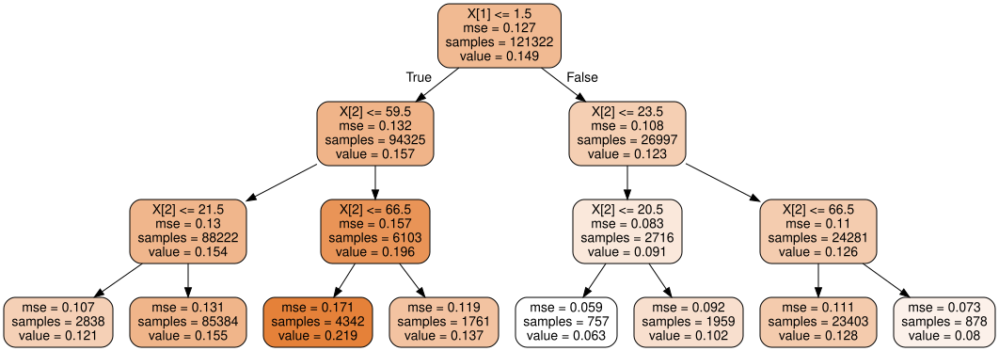

In [135]:
X=final[['const', 'gender','age','disability','inequality','crime','dropout rate']].values
y=final['downward'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=25)
q1_tree=DecisionTreeRegressor(max_depth=3, min_samples_leaf=5)
q1_tree.fit(X_train, y_train)
q1_tree_viz=export_graphviz(
    q1_tree,
    out_file=None,
    rounded=True,
    filled=True,
)
graph = graphviz.Source(q1_tree_viz)
graph.render('q1_tree_viz')
graph

# Findings:
1. The fluctuation of the probability of men's income movement is larger when they are after 60 years old than before 60 years old (One reason is lack of data).
2. The probability of downward movement decreases slightly when men are between 20 and 30, and remain roughly constant between 30 and 60.
3. For men, the probability of downward movement might increase after 60 years old.
4. For men, the probability of upward movement remain roughly constant between 20 and 50 years old, but shows a decreasing trend after 50 years old.
5. Usually, upward probabilities for men (especially $p_{12}$, $p_{23}$) are higher than the corresponding downward probabilities ($p_{21}$, $p_{32}$) before 60 years old.
6. Before 60 years old, $p_{44}$ is the highest among $p_{ii}$ (i.e., $p_{11}$, $p_{22}$, $p_{33}$, and $p_{44}$) for men.
7. Men's $p_{11}$ increases in age.
1. For women, the probability of downward movement remains roughly constant across age.
2. For women, the probability of upward movement remain roughly constant between 20 and 40 years old, but shows a decreasing trend after 40 years old.
3. For women, upward probabilities are similar with the corresponding downward probabilities before 60 years old.
4. For women, $p_{11}$ also increases in age, which is the same as men, but $p_{44}$ is not significantly higher than other $p_{ii}$.
5. Women's upward probability is significantly lower than that of men.
6. The probability of downward transition is similar between men and women.
1. The probability of men's downward transition in HHH and LLL decreases slightly between 20 and 30 years old, and remain roughly constant between 30 and 60 years old.
2. The probability of men's downward transition in HHH (High inequality, High crime rate, High high school drop out rate) is slightly higher (p43, p32) than that in LLL.
3. The p-value corresponding to the null hypothesis "the probabilities of downward mobility are the same in HHH and LLL" is 0.0031
4. Significant factors that influence downward transition: gender, age, disability, race, dropout rate.
5. Women have higher downward probability compared to men.
6. Older people have higher downward probability compared to younger people.
7. Nodisable people have higher downward probability compared to disable people.
8. The people living in the state that has higher high school dropout rate have higher downward probability compared to those living in the state that has lower high school dropout rate.
9. Inequality and crime rate are not significantly correlated with downward transition.